Author: Yinan Wan and Bogdan Bintu

Date: 12/28/2022

This is inteded to generate probes for Yinan's genes to make zebrafish developmental atlas

In [1]:
#The first time runing these scripts build the fast c-libraries:
!cd LibraryDesign3\C_Tools && python setup.py build_ext --inplace

In [1]:
import sys
sys.path.append(r'LibraryDesign3\C_Tools')
from seqint import seq2Int,seq2Int_rc

In [2]:
import sys,os
sys.path.append(os.path.abspath(r'LibraryDesign3'))
import LibraryDesigner as ld
import LibraryTools as lt
#from seqint import seq2Int, seq2Int_rc
# some other packages may required
import Bio #use pip install biopython

U:\Scientific Data\RG-AS04-Data01\Yinan\ZebraMERFISH\1ProbeDesign\LibraryDesign3\C_Tools


### Construct count table of 17-mers across zebrafish transcriptome

See the video on how to donwload data from biomart:
https://www.youtube.com/watch?v=QvGT2G0-hYA
    

* Required files:

Download unspliced genes. This will couple all the exons together. The data is in Data\z11\zebrafish_GRCz11_genesUnspliced.fasta

Download zebrafish genome. The data is in Data\z11\GCF_000002035.6_GRCz11_genomic.fna

Zebrafish bulk transcriptome. The data is in Data\z11\E-ERAD-475-query-results.tpms.tsv

Repetitive sequences. The data is in Data\z11\repetitive.fasta



In [4]:
ct = ld.countTable(word=17,save_file=r'Data\z11\zebrafish_GRCz11_genesUnspliced_17w.bin',
                   sparse=False)
fl = r'Data\z11\zebrafish_GRCz11_genesUnspliced.fasta'
names,seqs = lt.fastaread(fl)
from tqdm import tqdm
for sq in tqdm(seqs):
    ct.consume(sq,verbose=False)
ct.complete(verbose=True)
ct.save()

100%|███████████████████████████████████████████████████████████████████████████| 37241/37241 [03:37<00:00, 171.29it/s]


Time to compute unique and clip: 149.89994478225708
Time to update matrix: 5.228780269622803


### Get the fasta files for the genes of interest

In [5]:
import numpy as np
import pandas as pd
fl = r'Data\library_design_1000genes.csv'
lib1000 = pd.read_csv(fl)
ids_all = lib1000["ID"]

E:\Anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
E:\Anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
C:\Users\wan0000\AppData\Local\Temp\ipykernel_7300\625864218.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [6]:
lib1000

,ID,pref.trans.ID,names.zv11,NAMES.zv10,is.TF,is.landmark,is.morph,is.morph.CRISPR,cell.type,is.top_1000,is.top_500
0,ENSDARG00000058179,ENSDART00000063665,ackr3b,ACKR3B,False,False,True,True,NaN,True,True
1,ENSDARG00000037870,ENSDART00000141737,actb2,ACTB2,False,False,True,False,NaN,True,True
2,ENSDARG00000018968,ENSDART00000023094,acvr1ba,ACVR1BA,False,False,True,False,NaN,True,True
3,ENSDARG00000056250,ENSDART00000078703,add3b,ADD3B,False,False,True,False,NaN,True,True
4,ENSDARG00000039429,ENSDART00000159585,adka,ADKA,False,False,False,False,NaN,True,True
...,...,...,...,...,...,...,...,...,...,...,...
995,ENSDARG00000079376,ENSDART00000152635,zgc:174153,ZGC:174153,False,False,False,False,NaN,True,False
996,ENSDARG00000092889,ENSDART00000136306,zgc:194246,SYCE3,False,False,True,False,NaN,True,False
997,ENSDARG00000040971,ENSDART00000060037,zgc:92606,GABARAPL1,False,False,True,False,NaN,True,False
998,ENSDARG00000035563,ENSDART00000051553,znf703,ZNF703,False,False,True,False,NaN,True,False


Download the sequences from biomart using R package biomaRt. The cDNA file is in Data\lib1000_cdna.fasta
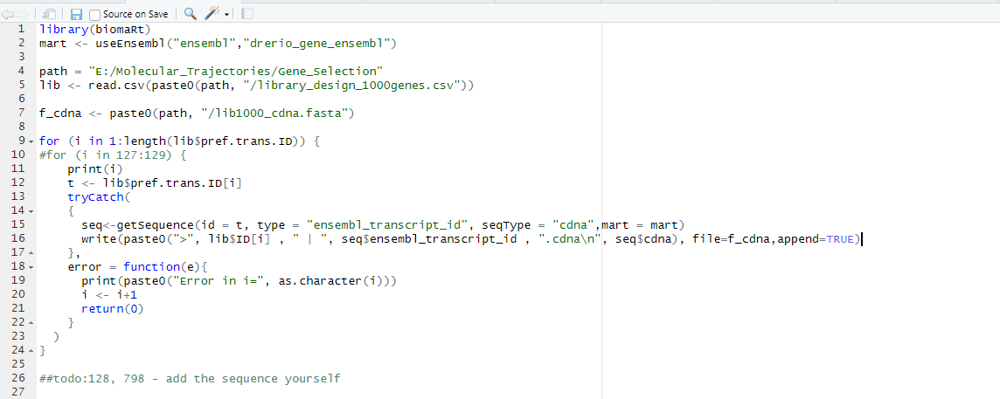


### average scRNA seq data per "cell type"

In [1]:
import sys,os
import numpy as np, matplotlib.pyplot as plt
import pickle
import imp
import glob
from tqdm import tqdm_notebook as tqdm

import scanpy as sc
from scipy.stats import zscore
import numpy as np
import pandas as pd

C:\Users\wan0000\AppData\Local\Temp\ipykernel_500\2054833587.py:4: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp


In [2]:
fl = r'Data\GSE66688_zdata.expMatrix.txt' #experimental data of sc RNA seq
lines = np.array([ln[:-1].split('\t') for ln in open(fl,'r') if len(ln)>0][1:])
data_sc = np.array(lines[:,1:],dtype=np.float32)
genes_sc = lines[:,0]

C:\Users\wan0000\AppData\Roaming\Python\Python39\site-packages\anndata\_core\anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


         Falling back to preprocessing with `sc.pp.pca` and default params.


C:\Users\wan0000\AppData\Local\Temp\ipykernel_500\4050129162.py:28: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(scdata2_sc, resolution=2) ####


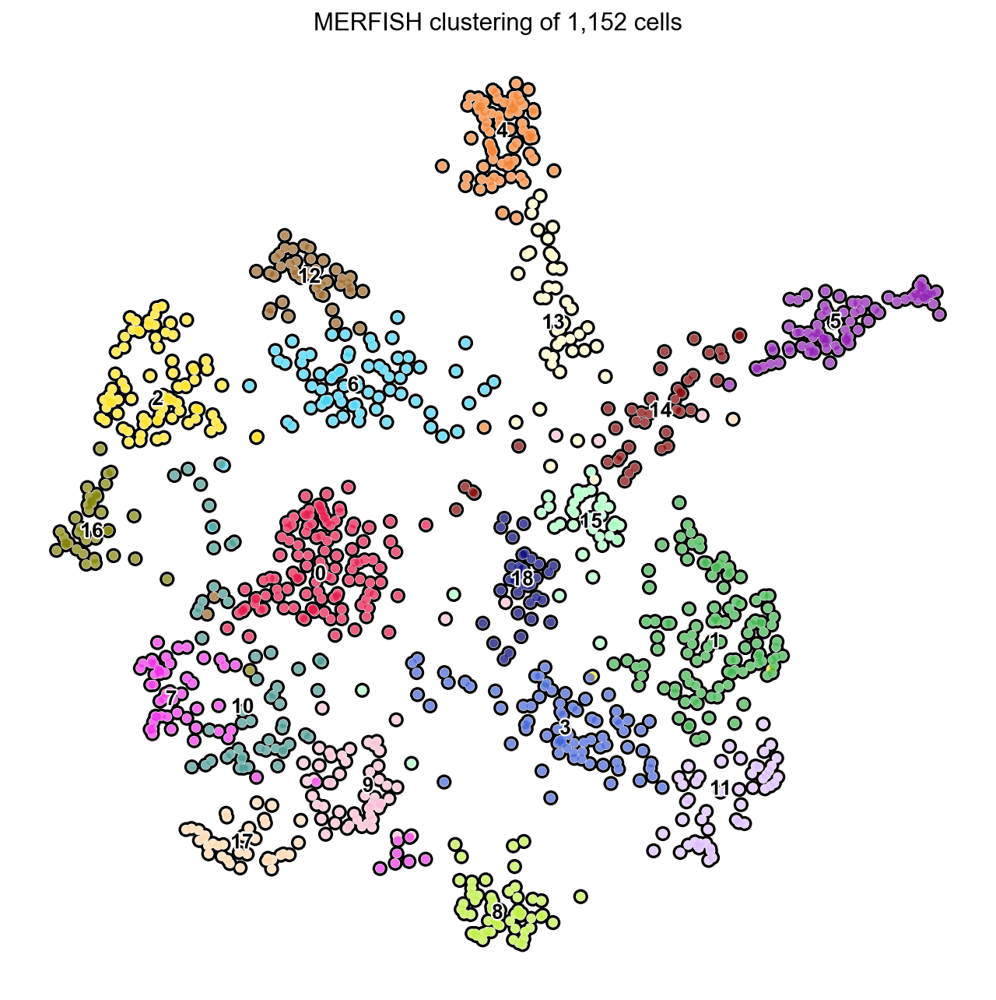

In [3]:
count_table2 = pd.DataFrame(data=data_sc.T, columns=genes_sc)



scdata2_sc = sc.AnnData(count_table2)

sc.pp.filter_cells(scdata2_sc, min_genes=5)
sc.pp.calculate_qc_metrics(scdata2_sc, percent_top=None, inplace=True)
sc.pp.normalize_total(scdata2_sc, target_sum=np.median(scdata2_sc.obs["total_counts"]))


### Tried volume normalization but did not work well.

#volume = np.array(list(celldata['volume'].reindex(index=scdata.obs.index.astype(int))),dtype=np.float)
#scdata.X = scdata.X/volume[:,np.newaxis]*np.median(volume)



sc.pp.log1p(scdata2_sc)

#scdata2.X = scdata2.to_df().apply(zscore, axis=0).to_numpy()

### Should we use PCA?

### Should we do z-scores. Explore this with spatial maps. Visual inspection.

sc.pp.neighbors(scdata2_sc)  #metric='correlation', use_rep = "X"
sc.tl.leiden(scdata2_sc, resolution=2) #### 
#plt.figure()
sc.tl.umap(scdata2_sc,random_state=9,min_dist=0.25)
cmap = ["#e6194B", "#3cb44b", "#ffe119", "#4363d8", "#f58231", "#911eb4", "#42d4f4", "#f032e6", "#bfef45",
        "#fabed4", "#469990", "#dcbeff", "#9A6324", "#fffac8", "#800000", "#aaffc3", "#808000", "#ffd8b1",
        "#000075", "#a9a9a9"]

sc.set_figure_params(figsize=(10,10))
sc.pl.umap(
    scdata2_sc,
    color="leiden",
    add_outline=True,
    legend_loc="on data",
    legend_fontsize=12,
    legend_fontoutline=2,
    frameon=False,
    title=f"MERFISH clustering of {len(scdata2_sc):,d} cells",
    palette=cmap
)

In [4]:
leiden = scdata2_sc.obs['leiden']
norm_counts = np.exp(scdata2_sc.X)-1
CTM = np.array([np.mean(norm_counts[leiden==cl],axis=0) for cl in np.unique(leiden)])
genes = list(scdata2_sc.var.index)

In [101]:
if not os.path.exists(r'Data\top_tr'):
    os.mkdir('Data\top_tr')

In [9]:
cells = ['']+['cell_type_'+str(cell) for cell in np.unique(leiden)]
head = ','.join(cells)+'\n'
fid = open(r'Data\top_tr\50percEpibo_umis.txt','w')
fid.write(head)
for ign,gn in enumerate(genes):
    txt = gn+','+','.join(CTM[:,ign].astype(str))+'\n'
    fid.write(txt)
fid.close()

### Make a file with the top 100 and 500 genes per cell type

In [10]:
import sys,os
sys.path.append(os.path.abspath(r'LibraryDesign3'))
import LibraryTools as lt
import numpy as np

In [11]:
transcript_file = r'Data\z11\zebrafish_GRCz11_genesUnspliced.fasta'
namesT,seqsT = lt.fastaread(transcript_file)
dic_sq = {nm.split('|')[-4].upper():sq for sq,nm in zip(seqsT,namesT)}

In [14]:
umi_files = [r'Data\top_tr\50percEpibo_umis.txt']
def read_umi_fl(fl):
    lines = [ln[:-1].split(',') for ln in open(fl,'r')]
    cells = lines[0][1:]
    genes = [ln[0] for ln in lines[1:]]
    M = np.array([ln[1:] for ln in lines[1:]],dtype=np.float32)
    return np.array(cells),np.array(genes),M

genes_bad = []
for umi_fl in umi_files:
    cells,genes,M = read_umi_fl(umi_fl)
    bad = np.unique(np.argsort(M,axis=0)[-100:,:])
    genes_bad += list(genes[bad])
genes_bad = list(np.unique(genes_bad))
genes_bad = [gn.upper() for gn in genes_bad]
seqs = [dic_sq[gn] for gn in genes_bad if gn in dic_sq]
names = [gn for gn in genes_bad if gn in dic_sq]
print("Number of genes with high expression:",len(names))
lt.fastawrite(r'Data\top_tr\top_tr100.fasta',
              names,seqs)


Number of genes with high expression: 178


In [15]:
umi_files = [r'Data\top_tr\50percEpibo_umis.txt']
def read_umi_fl(fl):
    lines = [ln[:-1].split(',') for ln in open(fl,'r')]
    cells = lines[0][1:]
    genes = [ln[0] for ln in lines[1:]]
    M = np.array([ln[1:] for ln in lines[1:]],dtype=np.float32)
    return np.array(cells),np.array(genes),M

genes_bad = []
for umi_fl in umi_files:
    cells,genes,M = read_umi_fl(umi_fl)
    bad = np.unique(np.argsort(M,axis=0)[-500:,:])
    genes_bad += list(genes[bad])
genes_bad = list(np.unique(genes_bad))
genes_bad = [gn.upper() for gn in genes_bad]
seqs = [dic_sq[gn] for gn in genes_bad if gn in dic_sq]
names = [gn for gn in genes_bad if gn in dic_sq]
print("Number of genes with high expression:",len(names))
lt.fastawrite(r'Data\top_tr\top_tr500.fasta',
              names,seqs)


Number of genes with high expression: 812


### Make a file with the top 3000 genes at the 50% epiboly stage

In [1]:
txt = [[e if e!='' else '0' for e in ln[:-1].split('\t')] 
       for ln in open(r'Data\z11\E-ERAD-475-query-results.tpms.tsv','r') if ln[0]!='#' and len(ln)>2]

In [2]:
head = txt[0]
i50 = head.index('gastrula 50%-epiboly')
import numpy as np
gene_ids = np.array(txt)[1:,0]
tpm50 = np.array(txt)[1:,i50].astype(np.float32)

Text(0.5, 0, 'Sorted genes')

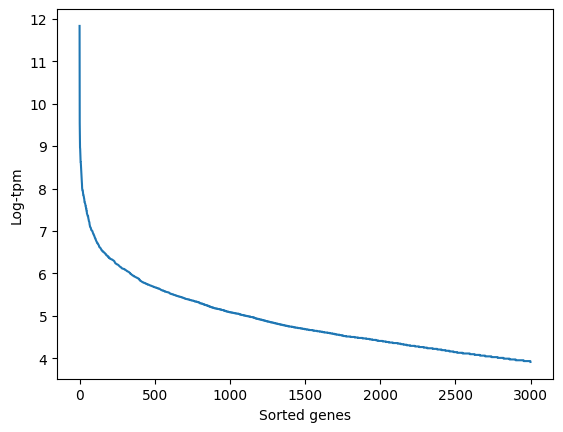

In [3]:
imaxs = np.argsort(tpm50)[::-1][:3000]
from matplotlib.pylab import plt
plt.figure()
plt.plot(np.log(tpm50[imaxs]))
plt.ylabel('Log-tpm')
plt.xlabel('Sorted genes')

In [4]:
import sys,os
sys.path.append(os.path.abspath(r'LibraryDesign3'))
import LibraryDesigner as ld
import LibraryTools as lt
from seqint import seq2Int, seq2Int_rc
# some other packages may required
import Bio #use pip install biopython

U:\Scientific Data\RG-AS04-Data01\Yinan\ZebraMERFISH\1ProbeDesign\LibraryDesign3\C_Tools


In [5]:
names_gns,seqs_gns = lt.fastaread(r'Data\z11\zebrafish_GRCz11_genesUnspliced.fasta')
names_gns_ = [gn.split('|')[0]for gn in names_gns]

In [6]:
bad_genes = gene_ids[imaxs]
ibad_gns = [ibad for ibad,gn in enumerate(names_gns_) if gn in bad_genes]

In [7]:
bad_names = np.array(names_gns)[ibad_gns]
bad_seqs = np.array(seqs_gns)[ibad_gns]

In [8]:
lt.fastawrite(r'Data\z11\zebrafish_GRCz11_genesUnspliced_top3000_50p-epiboly.fasta',bad_names,bad_seqs)

### Design target probes

#### Save fasta sequences to individual files

In [20]:
if not os.path.exists(r'Lib1000'):
    os.mkdir('Lib1000')
    
if not os.path.exists(r'Lib1000\single_genes_ENSDARG'):
    os.mkdir('Lib1000\single_genes_ENSDARG')

In [16]:
namesf,seqsf = lt.fastaread(r'Data\lib1000_cdna.fasta')
fld = r'Lib1000\single_genes_ENSDARG'
if not os.path.exists(fld): os.makedirs(fld)
for nm,sq in zip(namesf,seqsf):
    gn = nm.split('|')[2].replace(':','_') + '_' + nm.split('|')[0]
    lt.fastawrite(fld+os.sep+gn+'.fasta',[nm],[sq])

### Find missing isoforms

#### Construct 12 bp count table per gene across transcriptome

In [17]:
import sys,os,glob
sys.path.append(r'.\LibraryDesign3')
sys.path.append(r'.\LibraryDesign3\C_Tools')
import LibraryTools as lt
import numpy as np
import LibraryDesigner as ld
import pickle
from tqdm import tqdm

def get_ints(sq,word = 12,verbose=True):
    ints = []
    if len(sq)>=word:
        sq_ = sq.encode()# encode to bytes
        iters = tqdm(range(len(sq_)-word+1)) if verbose else range(len(sq_)-word+1)
        for i in iters:
            ints.append(ld.seq2Int(sq_[i:i+word]))
    return ints


transcript_file = r'Data\z11\zebrafish_GRCz11_genesUnspliced.fasta'
namesT,seqsT = lt.fastaread(transcript_file)

from tqdm.notebook import tqdm
intsT = [np.unique(get_ints(sq.upper(),verbose=False)) for sq in tqdm(seqsT)]


pickle.dump(intsT,open(r'Data\z11\zebrafish_GRCz11_genesUnspliced12bp.pkl','wb'))

np.save(r'Data\z11\names_transcriptome.npy',namesT)

  0%|          | 0/37241 [00:00<?, ?it/s]

#### Check for isoforms for each fasta file

In [21]:
print(os.path.abspath(r'Data\z11\zebrafish_GRCz11_genesUnspliced12bp.pkl'))

U:\Scientific Data\RG-AS04-Data01\Yinan\ZebraMERFISH\1ProbeDesign\Data\z11\zebrafish_GRCz11_genesUnspliced12bp.pkl


In [25]:
import sys,os,glob
sys.path.append(r'.\LibraryDesign3')
import LibraryTools as lt
import numpy as np
import LibraryDesigner as ld
import pickle
from tqdm import tqdm

def get_ints(sq,word = 12,verbose=True):
    ints = []
    if len(sq)>=word:
        sq_ = sq.encode()# encode to bytes
        iters = tqdm(range(len(sq_)-word+1)) if verbose else range(len(sq_)-word+1)
        for i in iters:
            ints.append(ld.seq2Int(sq_[i:i+word]))
    return ints
def result_file(in_files,word=12):
    """
    writes results of homology to file replacing each filename .fasta -> _isoResults.results
    This file contains names of sequences with high homology, pvalue assuming Bernoulli, 
    fraction of orginal transcript homology, fraction of target trancript homology
    """
    import sys,os,glob
    sys.path.append(os.path.abspath(r'LibraryDesign3'))
    import LibraryTools as lt
    import numpy as np
    import LibraryDesigner as ld
    import pickle
    from tqdm import tqdm
    def get_ints(sq,word = 12,verbose=True):
        ints = []
        if len(sq)>=word:
            sq_ = sq.encode()# encode to bytes
            iters = tqdm(range(len(sq_)-word+1)) if verbose else range(len(sq_)-word+1)
            for i in iters:
                ints.append(ld.seq2Int(sq_[i:i+word]))
        return ints
    
    fl_ints = r'Data\z11\zebrafish_GRCz11_genesUnspliced12bp.pkl'
    ints_tr  = pickle.load(open(fl_ints,'rb'))
    lens_tr = [len(int_) for int_ in ints_tr]
    names_tr = np.load(r'Data\z11\names_transcriptome.npy')
    for fl in tqdm(in_files):
        fl_ = fl.replace('.fasta','_isoResults.results')
        if not os.path.exists(fl_):
            sq_T = lt.fastaread(fl)[-1][0]
            word=12
            lens_ = lens_tr
            ints__ = ints_tr
            names__ = names_tr
            intT = np.unique(get_ints(sq_T,word = word,verbose=False)[::word])
            CT = np.array([np.in1d(intT,int_,assume_unique=True) for int_ in tqdm(ints__)])
            logprand = np.log(np.sum(CT[:,:]))-np.log(np.sum(lens_))-np.log(CT.shape[-1])
            from scipy.stats import binomtest
            pvalues = []
            for itr in np.arange(len(CT)):
                pvalue=1
                if lens_[itr]>0:
                    result = binomtest(np.sum(CT[itr]), n=lens_[itr], p=np.exp(logprand+np.log(CT.shape[-1])), alternative='greater')
                    pvalue = result.pvalue
                pvalues.append(pvalue)
            ibest = np.argsort(np.log(pvalues))[:500]
            result = [(names__[ib],pvalues[ib],np.mean(CT[ib]),np.sum(CT[ib])/lens_[ib]*word) for ib in ibest]
            text = '\n'.join([','.join([str(e) for e in ln]) for ln in result])

            fid = open(fl_,'w')
            fid.write(text)
            fid.close()

In [28]:
in_files = glob.glob(r'Lib1000\single_genes_ENSDARG\*.fasta')
in_files = [fl for fl in in_files if 'auto' not in fl.lower()]
len(in_files)

1000

In [27]:
result_file(in_files)

 66%|█████████████████████████████████████████████████                         | 24717/37241 [00:06<00:02, 4345.11it/s]


100%|██████████████████████████████████████████████████████████████████████████| 37241/37241 [00:09<00:00, 3942.81it/s]
C:\Users\wan0000\AppData\Local\Temp\ipykernel_15284\3179363217.py:62: RuntimeWarning: divide by zero encountered in log
  ibest = np.argsort(np.log(pvalues))[:500]
 37%|███████████████████████████▌                                              | 13871/37241 [00:04<00:07, 3224.79it/s]


 20%|███████████████▎                                                           | 7578/37241 [00:02<00:07, 3737.62it/s]


  2%|█▋                                                                          | 814/37241 [00:00<00:13, 2703.60it/s]


 74%|██████████████████████████████████████████████████████▍                   | 27400/37241 [00:07<00:02, 4431.90it/s]


 49%|████████████████████████████████████▎                                     | 18283/37241 [00:05<00:04, 4670.34it/s]


 30%|██████████████████████▍                                                   | 11264/37241 [00:03<00:08, 3213.32it/s]


 13%|█████████▊                                                                 | 4856/37241 [00:01<00:09, 3314.32it/s]


 98%|████████████████████████████████████████████████████████████████████████▍ | 36481/37241 [00:08<00:00, 5718.29it/s]


 68%|█████████████████████████████████████████████████▉                        | 25149/37241 [00:06<00:02, 4510.55it/s]


 42%|███████████████████████████████▏                                          | 15689/37241 [00:04<00:05, 3641.22it/s]


 25%|██████████████████▋                                                        | 9263/37241 [00:02<00:07, 3992.79it/s]


  7%|█████▍                                                                     | 2704/37241 [00:00<00:11, 2951.30it/s]


 87%|████████████████████████████████████████████████████████████████▋         | 32562/37241 [00:08<00:00, 5874.43it/s]


 61%|█████████████████████████████████████████████▍                            | 22852/37241 [00:06<00:02, 5413.32it/s]


 38%|████████████████████████████▏                                             | 14175/37241 [00:04<00:07, 3178.94it/s]


 21%|███████████████▌                                                           | 7735/37241 [00:02<00:07, 3696.00it/s]


  3%|██                                                                         | 1013/37241 [00:00<00:14, 2459.23it/s]


 77%|█████████████████████████████████████████████████████████▎                | 28861/37241 [00:07<00:01, 5497.75it/s]


 49%|████████████████████████████████████▎                                     | 18266/37241 [00:05<00:04, 4481.21it/s]


 28%|████████████████████▊                                                     | 10472/37241 [00:03<00:08, 3298.06it/s]


  9%|██████▊                                                                    | 3392/37241 [00:01<00:11, 2965.81it/s]


 91%|███████████████████████████████████████████████████████████████████▎      | 33906/37241 [00:08<00:00, 5662.63it/s]


 64%|███████████████████████████████████████████████▋                          | 23970/37241 [00:06<00:02, 5205.78it/s]


 41%|██████████████████████████████▎                                           | 15271/37241 [00:04<00:06, 3617.86it/s]


 25%|██████████████████▍                                                        | 9130/37241 [00:02<00:07, 4009.00it/s]


  7%|█████▎                                                                     | 2611/37241 [00:00<00:12, 2814.17it/s]


 90%|██████████████████████████████████████████████████████████████████▍       | 33436/37241 [00:08<00:00, 5932.06it/s]


 62%|██████████████████████████████████████████████▏                           | 23248/37241 [00:06<00:02, 5391.12it/s]


 39%|████████████████████████████▉                                             | 14560/37241 [00:04<00:06, 3429.90it/s]


 21%|███████████████▊                                                           | 7881/37241 [00:02<00:07, 3719.00it/s]


  5%|███▊                                                                       | 1875/37241 [00:00<00:11, 3090.91it/s]


 85%|███████████████████████████████████████████████████████████████▏          | 31795/37241 [00:07<00:00, 6139.74it/s]


 61%|█████████████████████████████████████████████                             | 22687/37241 [00:06<00:02, 5381.36it/s]


 38%|███████████████████████████▊                                              | 13968/37241 [00:04<00:06, 3340.70it/s]


 20%|███████████████                                                            | 7457/37241 [00:02<00:07, 3765.76it/s]


  4%|███                                                                        | 1543/37241 [00:00<00:13, 2661.49it/s]


 80%|███████████████████████████████████████████████████████████               | 29737/37241 [00:07<00:01, 5636.58it/s]


 53%|███████████████████████████████████████                                   | 19641/37241 [00:05<00:03, 4745.42it/s]


 32%|███████████████████████▉                                                  | 12068/37241 [00:03<00:08, 3114.27it/s]


 15%|███████████▎                                                               | 5622/37241 [00:01<00:09, 3251.82it/s]


  0%|                                                                                        | 0/37241 [00:00<?, ?it/s]


 75%|███████████████████████████████████████████████████████▊                  | 28102/37241 [00:07<00:01, 5288.14it/s]


 51%|█████████████████████████████████████▋                                    | 18994/37241 [00:05<00:03, 5277.15it/s]


 31%|██████████████████████▉                                                   | 11566/37241 [00:03<00:08, 3167.28it/s]


 12%|████████▉                                                                  | 4445/37241 [00:01<00:10, 3113.82it/s]


 94%|█████████████████████████████████████████████████████████████████████▋    | 35042/37241 [00:08<00:00, 5474.23it/s]


 66%|████████████████████████████████████████████████▋                         | 24496/37241 [00:06<00:02, 4592.26it/s]


 41%|██████████████████████████████▎                                           | 15243/37241 [00:04<00:06, 3617.78it/s]


 22%|████████████████▊                                                          | 8371/37241 [00:02<00:08, 3552.04it/s]


  6%|████▋                                                                      | 2330/37241 [00:00<00:11, 3164.80it/s]


 89%|█████████████████████████████████████████████████████████████████▌        | 33023/37241 [00:07<00:00, 5844.26it/s]


 63%|██████████████████████████████████████████████▋                           | 23474/37241 [00:06<00:02, 5472.96it/s]


 39%|████████████████████████████▊                                             | 14472/37241 [00:04<00:07, 3236.89it/s]


 20%|███████████████▎                                                           | 7619/37241 [00:02<00:07, 3714.29it/s]


  4%|██▊                                                                        | 1378/37241 [00:00<00:13, 2656.67it/s]


 78%|██████████████████████████████████████████████████████████                | 29194/37241 [00:07<00:01, 5780.55it/s]


 50%|█████████████████████████████████████▏                                    | 18696/37241 [00:05<00:03, 4703.95it/s]


 29%|█████████████████████▎                                                    | 10710/37241 [00:03<00:08, 3236.76it/s]


 10%|███████▎                                                                   | 3641/37241 [00:01<00:11, 2940.31it/s]


 93%|████████████████████████████████████████████████████████████████████▌     | 34489/37241 [00:08<00:00, 5776.95it/s]


 67%|█████████████████████████████████████████████████▎                        | 24824/37241 [00:06<00:02, 4524.35it/s]


 39%|████████████████████████████▊                                             | 14509/37241 [00:04<00:06, 3317.45it/s]


 20%|███████████████▏                                                           | 7570/37241 [00:02<00:08, 3690.33it/s]


  4%|██▋                                                                        | 1334/37241 [00:00<00:13, 2611.70it/s]


 81%|████████████████████████████████████████████████████████████              | 30240/37241 [00:07<00:01, 5843.35it/s]


 56%|█████████████████████████████████████████▎                                | 20803/37241 [00:05<00:03, 5152.17it/s]


 35%|█████████████████████████▌                                                | 12891/37241 [00:03<00:07, 3253.82it/s]


 17%|█████████████                                                              | 6467/37241 [00:02<00:09, 3320.39it/s]


  2%|█▎                                                                          | 636/37241 [00:00<00:12, 2909.48it/s]


 76%|████████████████████████████████████████████████████████▍                 | 28429/37241 [00:07<00:01, 5331.29it/s]


 52%|██████████████████████████████████████▌                                   | 19410/37241 [00:05<00:03, 4853.35it/s]


 31%|██████████████████████▋                                                   | 11424/37241 [00:03<00:08, 3168.15it/s]


 13%|██████████                                                                 | 5026/37241 [00:01<00:09, 3248.87it/s]


  0%|                                                                                        | 0/37241 [00:00<?, ?it/s]


 70%|████████████████████████████████████████████████████                      | 26224/37241 [00:07<00:02, 4382.78it/s]


 46%|█████████████████████████████████▋                                        | 16976/37241 [00:05<00:04, 4056.43it/s]


 28%|████████████████████▋                                                     | 10397/37241 [00:03<00:07, 3517.33it/s]


 10%|███████▎                                                                   | 3657/37241 [00:01<00:11, 2855.05it/s]


 92%|████████████████████████████████████████████████████████████████████▍     | 34427/37241 [00:08<00:00, 5737.40it/s]


 67%|█████████████████████████████████████████████████▋                        | 25022/37241 [00:06<00:02, 4644.43it/s]


 39%|████████████████████████████▌                                             | 14382/37241 [00:04<00:06, 3321.33it/s]


 22%|████████████████▍                                                          | 8164/37241 [00:02<00:07, 3709.18it/s]


  6%|████▌                                                                      | 2239/37241 [00:00<00:12, 2845.59it/s]


 87%|████████████████████████████████████████████████████████████████▍         | 32459/37241 [00:08<00:00, 5956.39it/s]


 61%|█████████████████████████████████████████████                             | 22687/37241 [00:06<00:02, 5278.61it/s]


 37%|███████████████████████████▋                                              | 13936/37241 [00:04<00:06, 3379.67it/s]


 22%|████████████████▏                                                          | 8013/37241 [00:02<00:07, 3790.51it/s]


  6%|████▏                                                                      | 2068/37241 [00:00<00:12, 2848.59it/s]


 84%|██████████████████████████████████████████████████████████████▍           | 31407/37241 [00:07<00:00, 6158.25it/s]


 59%|███████████████████████████████████████████▍                              | 21889/37241 [00:05<00:02, 5512.69it/s]


 38%|███████████████████████████▊                                              | 13968/37241 [00:04<00:07, 3299.75it/s]


 19%|██████████████▎                                                            | 7135/37241 [00:02<00:08, 3483.22it/s]


  3%|██▌                                                                        | 1282/37241 [00:00<00:13, 2576.65it/s]


 83%|█████████████████████████████████████████████████████████████▏            | 30797/37241 [00:07<00:01, 5942.54it/s]


 58%|██████████████████████████████████████████▉                               | 21633/37241 [00:05<00:02, 5335.76it/s]


 38%|███████████████████████████▊                                              | 14007/37241 [00:04<00:07, 3277.13it/s]


 23%|█████████████████▌                                                         | 8740/37241 [00:02<00:07, 3918.69it/s]


  8%|██████                                                                     | 3030/37241 [00:00<00:10, 3306.43it/s]


 93%|████████████████████████████████████████████████████████████████████▉     | 34701/37241 [00:08<00:00, 5887.07it/s]


 68%|██████████████████████████████████████████████████▍                       | 25391/37241 [00:06<00:02, 4798.97it/s]


 45%|█████████████████████████████████▌                                        | 16882/37241 [00:05<00:05, 3964.87it/s]


 29%|█████████████████████▏                                                    | 10690/37241 [00:03<00:08, 3303.03it/s]


 12%|█████████                                                                  | 4521/37241 [00:01<00:10, 3220.72it/s]


  8%|██████▍                                                                       | 83/1000 [15:31<2:46:10, 10.87s/it]


 71%|████████████████████████████████████████████████████▋                     | 26529/37241 [00:07<00:02, 4380.45it/s]


 46%|█████████████████████████████████▋                                        | 16967/37241 [00:05<00:05, 3968.67it/s]


 28%|█████████████████████                                                     | 10585/37241 [00:03<00:07, 3448.94it/s]


 13%|█████████▌                                                                 | 4741/37241 [00:01<00:10, 3211.70it/s]


  9%|██████▊                                                                       | 87/1000 [16:18<2:53:44, 11.42s/it]


 75%|███████████████████████████████████████████████████████▋                  | 27994/37241 [00:07<00:01, 5198.13it/s]


 49%|████████████████████████████████████▏                                     | 18204/37241 [00:05<00:04, 4631.99it/s]


 30%|██████████████████████▌                                                   | 11325/37241 [00:03<00:08, 3221.37it/s]


 14%|██████████▏                                                                | 5059/37241 [00:01<00:10, 3146.46it/s]


  0%|                                                                                        | 0/37241 [00:00<?, ?it/s]


 74%|██████████████████████████████████████████████████████▌                   | 27439/37241 [00:07<00:02, 4642.95it/s]


 49%|███████████████████████████████████▉                                      | 18065/37241 [00:05<00:04, 4489.55it/s]


 30%|█████████████████████▉                                                    | 11026/37241 [00:03<00:08, 3220.40it/s]


 13%|█████████▌                                                                 | 4771/37241 [00:01<00:10, 3127.32it/s]


 10%|███████▍                                                                      | 95/1000 [17:49<2:50:36, 11.31s/it]


 73%|██████████████████████████████████████████████████████▏                   | 27242/37241 [00:07<00:02, 4605.44it/s]


 52%|██████████████████████████████████████▎                                   | 19274/37241 [00:05<00:03, 5100.13it/s]


 34%|█████████████████████████▏                                                | 12670/37241 [00:03<00:07, 3445.52it/s]


 18%|█████████████▎                                                             | 6641/37241 [00:02<00:09, 3387.10it/s]


  2%|█▌                                                                          | 793/37241 [00:00<00:14, 2505.34it/s]


 78%|█████████████████████████████████████████████████████████▎                | 28871/37241 [00:07<00:01, 5450.29it/s]


 54%|███████████████████████████████████████▋                                  | 19973/37241 [00:05<00:03, 4949.78it/s]


 33%|████████████████████████▍                                                 | 12295/37241 [00:03<00:07, 3142.06it/s]


 16%|███████████▋                                                               | 5823/37241 [00:01<00:09, 3290.05it/s]


  0%|                                                                                        | 0/37241 [00:00<?, ?it/s]


 74%|██████████████████████████████████████████████████████▌                   | 27444/37241 [00:07<00:02, 4531.97it/s]


 52%|██████████████████████████████████████▏                                   | 19224/37241 [00:05<00:03, 5083.86it/s]


 33%|████████████████████████▌                                                 | 12372/37241 [00:03<00:07, 3255.08it/s]


 16%|████████████▎                                                              | 6094/37241 [00:02<00:09, 3378.86it/s]


  1%|▍                                                                           | 191/37241 [00:00<00:19, 1891.67it/s]


 75%|███████████████████████████████████████████████████████▊                  | 28102/37241 [00:07<00:01, 5368.35it/s]


 53%|███████████████████████████████████████                                   | 19649/37241 [00:05<00:03, 4824.86it/s]


 33%|████████████████████████▋                                                 | 12454/37241 [00:03<00:07, 3295.93it/s]


 17%|████████████▊                                                              | 6348/37241 [00:02<00:09, 3421.54it/s]


  2%|█▏                                                                          | 590/37241 [00:00<00:12, 2824.69it/s]


 76%|████████████████████████████████████████████████████████▏                 | 28266/37241 [00:07<00:01, 5183.13it/s]


 53%|██████████████████████████████████████▊                                   | 19555/37241 [00:05<00:03, 4852.65it/s]


 31%|███████████████████████                                                   | 11621/37241 [00:03<00:08, 3105.07it/s]


 12%|████████▋                                                                  | 4307/37241 [00:01<00:11, 2983.22it/s]


 93%|████████████████████████████████████████████████████████████████████▌     | 34520/37241 [00:08<00:00, 5593.71it/s]


 61%|█████████████████████████████████████████████                             | 22668/37241 [00:06<00:02, 5406.10it/s]


 35%|██████████████████████████▏                                               | 13173/37241 [00:04<00:07, 3148.43it/s]


 16%|████████████▎                                                              | 6096/37241 [00:02<00:09, 3238.65it/s]


  1%|█                                                                           | 548/37241 [00:00<00:13, 2788.05it/s]


 77%|████████████████████████████████████████████████████████▊                 | 28604/37241 [00:07<00:01, 5247.86it/s]


 47%|██████████████████████████████████▋                                       | 17426/37241 [00:05<00:05, 3955.16it/s]


 27%|████████████████████▎                                                     | 10208/37241 [00:03<00:07, 3438.21it/s]


  8%|██████                                                                     | 2989/37241 [00:01<00:10, 3122.49it/s]


 87%|████████████████████████████████████████████████████████████████▍         | 32399/37241 [00:08<00:00, 5970.06it/s]


 51%|██████████████████████████████████████                                    | 19127/37241 [00:05<00:03, 5180.21it/s]


 33%|████████████████████████▍                                                 | 12310/37241 [00:03<00:07, 3435.33it/s]


 18%|█████████████▍                                                             | 6679/37241 [00:02<00:08, 3408.82it/s]


  3%|██▌                                                                        | 1253/37241 [00:00<00:12, 2903.94it/s]


 66%|████████████████████████████████████████████████▉                         | 24635/37241 [00:07<00:03, 3956.82it/s]


 30%|██████████████████████▌                                                   | 11354/37241 [00:04<00:09, 2769.24it/s]


  9%|██████▋                                                                    | 3300/37241 [00:01<00:11, 3064.07it/s]


 89%|█████████████████████████████████████████████████████████████████▉        | 33176/37241 [00:08<00:00, 5916.29it/s]


 63%|██████████████████████████████████████████████▎                           | 23312/37241 [00:06<00:02, 5401.80it/s]


 39%|████████████████████████████▌                                             | 14380/37241 [00:04<00:07, 3237.50it/s]


 20%|██████████████▉                                                            | 7439/37241 [00:02<00:08, 3695.54it/s]


  3%|██▏                                                                        | 1103/37241 [00:00<00:13, 2622.27it/s]


 78%|█████████████████████████████████████████████████████████▉                | 29137/37241 [00:07<00:01, 5653.92it/s]


 50%|████████████████████████████████████▋                                     | 18460/37241 [00:05<00:03, 4731.84it/s]


 31%|██████████████████████▋                                                   | 11421/37241 [00:03<00:08, 3217.45it/s]


 14%|██████████▏                                                                | 5082/37241 [00:01<00:10, 3032.54it/s]


100%|██████████████████████████████████████████████████████████████████████████| 37241/37241 [00:08<00:00, 4226.63it/s]


 69%|███████████████████████████████████████████████████▎                      | 25838/37241 [00:06<00:02, 4640.19it/s]


 44%|████████████████████████████████▋                                         | 16432/37241 [00:04<00:05, 4053.15it/s]


 26%|███████████████████▎                                                       | 9571/37241 [00:02<00:06, 3953.42it/s]


  8%|██████                                                                     | 3035/37241 [00:01<00:10, 3180.58it/s]


 89%|██████████████████████████████████████████████████████████████████▏       | 33325/37241 [00:08<00:00, 5771.25it/s]


 60%|████████████████████████████████████████████▋                             | 22470/37241 [00:06<00:02, 5466.51it/s]


 35%|██████████████████████████▏                                               | 13176/37241 [00:04<00:07, 3293.89it/s]


 17%|████████████▋                                                              | 6322/37241 [00:02<00:09, 3292.14it/s]


  2%|█▏                                                                          | 588/37241 [00:00<00:12, 2968.61it/s]


 80%|███████████████████████████████████████████████████████████▏              | 29781/37241 [00:07<00:01, 5906.97it/s]


 54%|███████████████████████████████████████▋                                  | 19960/37241 [00:05<00:03, 4919.84it/s]


 32%|███████████████████████▍                                                  | 11776/37241 [00:03<00:08, 3181.44it/s]


 13%|█████████▋                                                                 | 4826/37241 [00:01<00:10, 3195.52it/s]


 98%|████████████████████████████████████████████████████████████████████████▍ | 36446/37241 [00:08<00:00, 5697.12it/s]


 69%|██████████████████████████████████████████████████▉                       | 25641/37241 [00:06<00:02, 4496.34it/s]


 43%|███████████████████████████████▍                                          | 15842/37241 [00:04<00:05, 3726.87it/s]


 23%|█████████████████▎                                                         | 8605/37241 [00:02<00:07, 3810.42it/s]


  5%|███▊                                                                       | 1891/37241 [00:00<00:11, 3153.92it/s]


 83%|█████████████████████████████████████████████████████████████▋            | 31055/37241 [00:07<00:01, 5972.63it/s]


 57%|██████████████████████████████████████████▎                               | 21272/37241 [00:05<00:03, 5247.15it/s]


 34%|█████████████████████████▍                                                | 12830/37241 [00:03<00:07, 3274.57it/s]


 17%|████████████▌                                                              | 6233/37241 [00:02<00:09, 3440.72it/s]


  0%|                                                                                        | 0/37241 [00:00<?, ?it/s]


 71%|████████████████████████████████████████████████████▎                     | 26345/37241 [00:07<00:02, 4400.46it/s]


 44%|████████████████████████████████▉                                         | 16560/37241 [00:04<00:05, 4050.58it/s]


 28%|████████████████████▊                                                     | 10460/37241 [00:03<00:07, 3482.61it/s]


 10%|███████▋                                                                   | 3806/37241 [00:01<00:10, 3061.80it/s]


 89%|█████████████████████████████████████████████████████████████████▉        | 33184/37241 [00:08<00:00, 5732.87it/s]


 64%|███████████████████████████████████████████████▏                          | 23738/37241 [00:06<00:02, 5455.85it/s]


 40%|█████████████████████████████▋                                            | 14966/37241 [00:04<00:06, 3470.44it/s]


 25%|██████████████████▍                                                        | 9140/37241 [00:02<00:07, 3901.80it/s]


  6%|████▊                                                                      | 2382/37241 [00:00<00:12, 2880.98it/s]


 80%|███████████████████████████████████████████████████████████▍              | 29882/37241 [00:07<00:01, 5379.60it/s]


 50%|█████████████████████████████████████▎                                    | 18786/37241 [00:05<00:03, 4818.54it/s]


 31%|██████████████████████▉                                                   | 11567/37241 [00:03<00:07, 3217.71it/s]


 16%|███████████▊                                                               | 5860/37241 [00:01<00:09, 3413.22it/s]


  1%|▍                                                                           | 226/37241 [00:00<00:17, 2066.27it/s]


 73%|██████████████████████████████████████████████████████▎                   | 27304/37241 [00:07<00:02, 4595.62it/s]


 48%|███████████████████████████████████▍                                      | 17809/37241 [00:05<00:04, 4309.91it/s]


 28%|█████████████████████                                                     | 10576/37241 [00:03<00:08, 3190.36it/s]


  7%|█████▌                                                                     | 2737/37241 [00:01<00:12, 2810.75it/s]


 85%|██████████████████████████████████████████████████████████████▊           | 31582/37241 [00:07<00:00, 6067.12it/s]


 54%|███████████████████████████████████████▉                                  | 20068/37241 [00:05<00:03, 4874.93it/s]


 31%|██████████████████████▉                                                   | 11535/37241 [00:03<00:08, 3019.67it/s]


 13%|█████████▌                                                                 | 4746/37241 [00:01<00:10, 3181.32it/s]


100%|██████████████████████████████████████████████████████████████████████████| 37241/37241 [00:08<00:00, 4238.85it/s]


 76%|████████████████████████████████████████████████████████                  | 28225/37241 [00:06<00:01, 5340.05it/s]


 51%|██████████████████████████████████████                                    | 19133/37241 [00:05<00:03, 5194.34it/s]


 32%|███████████████████████▊                                                  | 11961/37241 [00:03<00:08, 3132.08it/s]


 15%|███████████▏                                                               | 5530/37241 [00:01<00:09, 3256.47it/s]


  2%|█▏                                                                          | 575/37241 [00:00<00:13, 2661.44it/s]


 79%|██████████████████████████████████████████████████████████▎               | 29322/37241 [00:07<00:01, 5818.28it/s]


 54%|███████████████████████████████████████▉                                  | 20103/37241 [00:05<00:03, 4954.45it/s]


 28%|█████████████████████                                                     | 10579/37241 [00:03<00:09, 2844.67it/s]


  5%|███▉                                                                       | 1925/37241 [00:00<00:11, 3198.93it/s]


 92%|███████████████████████████████████████████████████████████████████▉      | 34169/37241 [00:07<00:00, 6385.64it/s]


 61%|█████████████████████████████████████████████▍                            | 22836/37241 [00:06<00:02, 5404.96it/s]


 38%|████████████████████████████▏                                             | 14174/37241 [00:04<00:07, 3187.68it/s]


 22%|████████████████▌                                                          | 8205/37241 [00:02<00:07, 3681.65it/s]


  6%|████▏                                                                      | 2066/37241 [00:00<00:12, 2819.77it/s]


 86%|███████████████████████████████████████████████████████████████▌          | 31960/37241 [00:07<00:00, 6177.65it/s]


 61%|█████████████████████████████████████████████▏                            | 22726/37241 [00:06<00:02, 5472.80it/s]


 35%|█████████████████████████▊                                                | 12998/37241 [00:04<00:07, 3078.10it/s]


 14%|██████████▋                                                                | 5296/37241 [00:01<00:10, 3081.24it/s]


 19%|██████████████▎                                                              | 186/1000 [34:56<2:35:24, 11.46s/it]


 76%|████████████████████████████████████████████████████████▎                 | 28326/37241 [00:07<00:01, 5306.11it/s]


 55%|████████████████████████████████████████▎                                 | 20303/37241 [00:05<00:03, 5089.79it/s]


 35%|█████████████████████████▋                                                | 12900/37241 [00:03<00:07, 3321.17it/s]


 18%|█████████████▎                                                             | 6618/37241 [00:02<00:09, 3336.10it/s]


  4%|██▊                                                                        | 1415/37241 [00:00<00:13, 2683.61it/s]


 83%|█████████████████████████████████████████████████████████████▍            | 30935/37241 [00:07<00:01, 5925.12it/s]


 55%|████████████████████████████████████████▎                                 | 20314/37241 [00:05<00:03, 4808.81it/s]


 35%|█████████████████████████▌                                                | 12880/37241 [00:03<00:07, 3350.08it/s]


 18%|█████████████▊                                                             | 6887/37241 [00:02<00:09, 3338.68it/s]


  4%|██▋                                                                        | 1311/37241 [00:00<00:14, 2531.97it/s]


 77%|████████████████████████████████████████████████████████▉                 | 28664/37241 [00:07<00:01, 4994.02it/s]


 48%|███████████████████████████████████▎                                      | 17771/37241 [00:05<00:04, 4157.79it/s]


 31%|██████████████████████▋                                                   | 11417/37241 [00:03<00:08, 3216.90it/s]


 14%|██████████▌                                                                | 5250/37241 [00:01<00:09, 3323.25it/s]


  1%|▍                                                                           | 242/37241 [00:00<00:16, 2212.41it/s]


 76%|███████████████████████████████████████████████████████▉                  | 28166/37241 [00:07<00:01, 5199.13it/s]


 54%|███████████████████████████████████████▊                                  | 20035/37241 [00:05<00:03, 5041.03it/s]


 36%|██████████████████████████▌                                               | 13351/37241 [00:03<00:07, 3297.40it/s]


 20%|███████████████                                                            | 7466/37241 [00:02<00:07, 3794.13it/s]


  5%|███▌                                                                       | 1785/37241 [00:00<00:12, 2947.70it/s]


 81%|████████████████████████████████████████████████████████████▏             | 30318/37241 [00:07<00:01, 6013.53it/s]


 52%|██████████████████████████████████████▏                                   | 19188/37241 [00:05<00:03, 5021.51it/s]


 32%|███████████████████████▍                                                  | 11824/37241 [00:03<00:08, 3053.51it/s]


 10%|███████▍                                                                   | 3676/37241 [00:01<00:11, 2894.34it/s]


 92%|████████████████████████████████████████████████████████████████████▏     | 34294/37241 [00:08<00:00, 5725.07it/s]


 67%|█████████████████████████████████████████████████▊                        | 25056/37241 [00:06<00:02, 4751.84it/s]


 43%|███████████████████████████████▋                                          | 15972/37241 [00:04<00:05, 3895.83it/s]


 26%|███████████████████▋                                                       | 9765/37241 [00:02<00:07, 3805.50it/s]


  9%|██████▊                                                                    | 3360/37241 [00:01<00:11, 3006.07it/s]


 90%|██████████████████████████████████████████████████████████████████▋       | 33586/37241 [00:08<00:00, 5866.52it/s]


 59%|███████████████████████████████████████████▊                              | 22029/37241 [00:06<00:03, 4883.21it/s]


 36%|██████████████████████████▌                                               | 13391/37241 [00:04<00:07, 3293.00it/s]


 19%|█████████████▉                                                             | 6942/37241 [00:02<00:08, 3373.49it/s]


  3%|██▍                                                                        | 1193/37241 [00:00<00:12, 2996.87it/s]


 79%|██████████████████████████████████████████████████████████▎               | 29368/37241 [00:07<00:01, 5751.03it/s]


 52%|██████████████████████████████████████▍                                   | 19342/37241 [00:05<00:03, 4711.25it/s]


 30%|██████████████████████▍                                                   | 11299/37241 [00:03<00:08, 3075.87it/s]


 11%|████████▍                                                                  | 4206/37241 [00:01<00:10, 3113.77it/s]


 94%|█████████████████████████████████████████████████████████████████████▊    | 35107/37241 [00:08<00:00, 5821.97it/s]


 64%|███████████████████████████████████████████████▎                          | 23814/37241 [00:06<00:02, 5216.04it/s]


 38%|████████████████████████████                                              | 14108/37241 [00:04<00:07, 3059.87it/s]


 17%|████████████▋                                                              | 6301/37241 [00:02<00:09, 3385.05it/s]


  1%|▍                                                                           | 223/37241 [00:00<00:16, 2228.48it/s]


 75%|███████████████████████████████████████████████████████▍                  | 27904/37241 [00:07<00:01, 5266.70it/s]


 53%|███████████████████████████████████████▏                                  | 19714/37241 [00:05<00:03, 4928.56it/s]


 34%|█████████████████████████▏                                                | 12677/37241 [00:03<00:07, 3389.34it/s]


 17%|████████████▉                                                              | 6434/37241 [00:02<00:09, 3373.66it/s]


  2%|█▌                                                                          | 744/37241 [00:00<00:14, 2519.66it/s]


 76%|████████████████████████████████████████████████████████▏                 | 28280/37241 [00:07<00:01, 5218.30it/s]


 49%|████████████████████████████████████                                      | 18144/37241 [00:05<00:04, 4697.86it/s]


 31%|██████████████████████▌                                                   | 11367/37241 [00:03<00:07, 3255.34it/s]


 13%|█████████▊                                                                 | 4875/37241 [00:01<00:09, 3301.05it/s]


100%|██████████████████████████████████████████████████████████████████████████| 37241/37241 [00:08<00:00, 4289.17it/s]


 72%|█████████████████████████████████████████████████████▎                    | 26825/37241 [00:06<00:02, 4369.58it/s]


 48%|███████████████████████████████████▎                                      | 17793/37241 [00:05<00:04, 4378.94it/s]


 29%|█████████████████████▎                                                    | 10740/37241 [00:03<00:07, 3344.14it/s]


 10%|███████▋                                                                   | 3818/37241 [00:01<00:11, 2932.16it/s]


 92%|████████████████████████████████████████████████████████████████████▎     | 34408/37241 [00:08<00:00, 5590.54it/s]


 68%|██████████████████████████████████████████████████                        | 25217/37241 [00:06<00:02, 4707.74it/s]


 44%|████████████████████████████████▊                                         | 16536/37241 [00:04<00:04, 4208.99it/s]


 29%|█████████████████████▎                                                    | 10748/37241 [00:03<00:08, 3220.72it/s]


 13%|█████████▍                                                                 | 4666/37241 [00:01<00:10, 3110.76it/s]


100%|██████████████████████████████████████████████████████████████████████████| 37241/37241 [00:08<00:00, 4225.16it/s]


 74%|██████████████████████████████████████████████████████▍                   | 27422/37241 [00:06<00:02, 4713.24it/s]


 52%|██████████████████████████████████████▍                                   | 19369/37241 [00:05<00:03, 5041.73it/s]


 31%|███████████████████████                                                   | 11626/37241 [00:03<00:08, 3026.61it/s]


 13%|█████████▍                                                                 | 4678/37241 [00:01<00:10, 3127.88it/s]


 98%|████████████████████████████████████████████████████████████████████████▎ | 36408/37241 [00:08<00:00, 5955.65it/s]


 69%|███████████████████████████████████████████████████▏                      | 25786/37241 [00:06<00:02, 4552.33it/s]


 44%|████████████████████████████████▍                                         | 16355/37241 [00:04<00:05, 4078.79it/s]


 27%|███████████████████▉                                                      | 10035/37241 [00:03<00:07, 3402.18it/s]


 11%|████████▏                                                                  | 4063/37241 [00:01<00:10, 3216.02it/s]


 95%|██████████████████████████████████████████████████████████████████████▌   | 35521/37241 [00:08<00:00, 5674.75it/s]


 65%|████████████████████████████████████████████████▏                         | 24251/37241 [00:06<00:02, 4793.73it/s]


 37%|███████████████████████████▋                                              | 13944/37241 [00:04<00:07, 3258.61it/s]


 18%|█████████████▊                                                             | 6860/37241 [00:02<00:09, 3225.94it/s]


  2%|█▌                                                                          | 760/37241 [00:00<00:14, 2528.47it/s]


 78%|█████████████████████████████████████████████████████████▍                | 28878/37241 [00:07<00:01, 5524.40it/s]


 50%|█████████████████████████████████████▏                                    | 18744/37241 [00:05<00:03, 4977.31it/s]


 32%|███████████████████████▍                                                  | 11790/37241 [00:03<00:07, 3210.51it/s]


 14%|██████████▌                                                                | 5239/37241 [00:01<00:09, 3204.95it/s]


100%|██████████████████████████████████████████████████████████████████████████| 37241/37241 [00:08<00:00, 4165.41it/s]


 70%|████████████████████████████████████████████████████                      | 26200/37241 [00:06<00:02, 4480.88it/s]


 45%|█████████████████████████████████▌                                        | 16901/37241 [00:05<00:05, 3944.57it/s]


 26%|███████████████████▍                                                       | 9664/37241 [00:03<00:07, 3874.15it/s]


  9%|██████▌                                                                    | 3270/37241 [00:01<00:11, 3040.21it/s]


 90%|██████████████████████████████████████████████████████████████████▍       | 33414/37241 [00:08<00:00, 5809.26it/s]


 63%|██████████████████████████████████████████████▎                           | 23277/37241 [00:06<00:02, 5422.41it/s]


 39%|████████████████████████████▉                                             | 14538/37241 [00:04<00:06, 3351.86it/s]


 23%|█████████████████                                                          | 8464/37241 [00:02<00:07, 3744.23it/s]


  7%|█████▎                                                                     | 2661/37241 [00:00<00:11, 3135.42it/s]


 94%|█████████████████████████████████████████████████████████████████████▍    | 34972/37241 [00:08<00:00, 5852.78it/s]


 66%|█████████████████████████████████████████████████                         | 24705/37241 [00:06<00:02, 4715.72it/s]


 43%|████████████████████████████████▏                                         | 16195/37241 [00:04<00:05, 4207.53it/s]


 28%|████████████████████▋                                                     | 10392/37241 [00:03<00:07, 3453.14it/s]


 10%|███████▎                                                                   | 3608/37241 [00:01<00:11, 2998.57it/s]


 26%|████████████████████▏                                                        | 262/1000 [49:17<2:18:51, 11.29s/it]


KeyboardInterrupt: 

#### Save the most likely isoform sequences for each file

In [29]:
names_top,seqs_top = lt.fastaread(r'MERFISH\top_tr500.fasta')
names_top2,seqs_top2 = lt.fastaread(r'MERFISH\top_tr100.fasta')
names_tr,seqs_tr = lt.fastaread(r'Data\z11\zebrafish_GRCz11_genesUnspliced.fasta')
names_tr_ = [nm.split('|')[-4].upper() for nm in names_tr]
len(names_top),len(names_top2)

(812, 178)

In [33]:
fls = glob.glob(r'Lib1000\single_genes_ENSDARG\*.results')
len(fls)

1000

In [31]:
fl = fls[-3]
print(fl)
M = np.array([ln[:-1].split(',') for ln in open(fl,'r')])
pval,fr1,fr2=M[:,1:].astype(np.float32).T
names_ = M[:,0]
names_ = np.array([nm.split('|')[-4].upper() for nm in names_])
np.array([names_,pval,fr1,fr2]).T[:10]

Lib1000\single_genes_ENSDARG\aplp2_ENSDARG00000054864_isoResults.results


array([['APLP2', '0.0', '0.9754464', '0.035242647'],
       ['SFT2D3', '6.802292e-12', '0.020089285', '0.06650246'],
       ['CU856520.1', '8.882412e-12', '0.020089285', '0.06451613'],
       ['CU856222.1', '3.2279828e-11', '0.017857144', '0.076861486'],
       ['SRSF2B', '3.6471524e-11', '0.03125', '0.0215357'],
       ['LO018231.1', '2.4748806e-10', '0.026785715', '0.024169184'],
       ['SLCO1D1', '2.5305044e-10', '0.05357143', '0.009210106'],
       ['SI:CH211-153F2.7', '2.849742e-10', '0.03125', '0.01834662'],
       ['MRPS25', '3.6494047e-10', '0.029017856', '0.020304568'],
       ['CR318603.1', '4.9040244e-10', '0.02455357', '0.02670443']],
      dtype='<U32')

Note: If more than 75% of the transcript is speciffically shared with a different sequence then consider it a missannotation of isoforms.

In [34]:
from tqdm.notebook import tqdm
for fl in tqdm(np.sort(fls)):
    M = np.array([ln[:-1].split(',') for ln in open(fl,'r')])
    pval,fr1,fr2=M[:,1:].astype(np.float32).T
    names_ = M[:,0]
    names_ = np.array([nm.split('|')[-4].upper() for nm in names_])

    keep = (np.log(pval)<np.log(10**(-3)))&(fr1>0.8)#################################
    #if True: #np.sum(keep)>1:
    #    print(fl)
    #    print(list(zip(names_[keep],pval[keep],fr1[keep],fr2[keep])))
    #    print()
    fl_save = fl.replace('_isoResults.results','_AutoIso_v2.fasta')
    inds_iso = [names_tr_.index(nm) for nm in names_[keep]]
    names_new = [names_tr_[itr] for itr in inds_iso]
    seqs_new = [seqs_tr[itr] for itr in inds_iso]
    lt.fastawrite(fl_save,names_new,seqs_new)

    inds_iso_top = [names_tr_.index(nm) for nm in names_[keep] if nm in names_top]
    names_new = [names_tr_[itr] for itr in inds_iso_top]
    seqs_new = [seqs_tr[itr] for itr in inds_iso_top]
    lt.fastawrite(fl_save.replace('_AutoIso_v2.fasta','_AutoIsoTop_v2.fasta'),names_new,seqs_new)

    inds_iso_top = [names_tr_.index(nm) for nm in names_[keep] if nm in names_top2]
    names_new = [names_tr_[itr] for itr in inds_iso_top]
    seqs_new = [seqs_tr[itr] for itr in inds_iso_top]
    lt.fastawrite(fl_save.replace('_AutoIso_v2.fasta','_AutoIsoTop2_v2.fasta'),names_new,seqs_new)

  0%|          | 0/1000 [00:00<?, ?it/s]

C:\Users\wan0000\AppData\Local\Temp\ipykernel_15284\1137338173.py:8: RuntimeWarning: divide by zero encountered in log
  keep = (np.log(pval)<np.log(10**(-3)))&(fr1>0.8)#################################


In [35]:
import sys,os
sys.path.append(os.path.abspath(r'LibraryDesign3'))
import LibraryTools as lt
import numpy as np
import LibraryDesigner as ld
import pickle
from tqdm import tqdm
import imp
imp.reload(lt)
imp.reload(ld)

U:\Scientific Data\RG-AS04-Data01\Yinan\ZebraMERFISH\1ProbeDesign\LibraryDesign3\C_Tools


C:\Users\wan0000\AppData\Local\Temp\ipykernel_15284\2896706087.py:8: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp


<module 'LibraryDesigner' from 'U:\\Scientific Data\\RG-AS04-Data01\\Yinan\\ZebraMERFISH\\1ProbeDesign\\LibraryDesign3\\LibraryDesigner.py'>

#### Check the auto-isoforms

Removed genes drll.1 and drl as the drll.2 probes for all three

In [36]:
import glob
fls_ = glob.glob(r'E:\Molecular_Trajectories\LibraryDesign\Lib1000\single_genes_ENSDARG\*_AutoIso_v2.fasta')
for fl in fls_:
    names_,seqs_ = lt.fastaread(fl)
    if ((os.path.basename(fl).split('_ENSDARG')[0]).lower()!=(names_[0].replace(':','_').lower())) | (names_[0]!=names_[-1]):
        print(os.path.basename(fl),names_)

apoc1_ENSDARG00000092170_AutoIso_v2.fasta ['APOC1', 'NBN']
apoeb_ENSDARG00000040295_AutoIso_v2.fasta ['APOEB', 'NBN']
arhgef10_ENSDARG00000077788_AutoIso_v2.fasta ['ARHGEF10', 'AL928723.3']
atrxl_ENSDARG00000099449_AutoIso_v2.fasta ['AL935333.4', 'ATRXL']
cxcr4b_ENSDARG00000041959_AutoIso_v2.fasta ['CXCR4B', 'CR522881.1']
drll.2_ENSDARG00000035150_AutoIso_v2.fasta ['DRLL.2', 'DRL', 'DRLL.1']
fzd10_ENSDARG00000068213_AutoIso_v2.fasta ['PIWIL1', 'FZD10']
gabrp_ENSDARG00000020901_AutoIso_v2.fasta ['GABRP', 'BX248097.2', 'BX248097.1']
hoxc6a_ENSDARG00000070343_AutoIso_v2.fasta ['HOXC6A', 'HOXC3A']
hoxc8a_ENSDARG00000070346_AutoIso_v2.fasta ['HOXC8A', 'HOXC3A']
nkx1.2la_ENSDARG00000006350_AutoIso_v2.fasta ['NKX1.2LA', 'BX294129.1']
psmb1_ENSDARG00000009640_AutoIso_v2.fasta ['PSMB1', 'BX323887.1']
rasl11b_ENSDARG00000015611_AutoIso_v2.fasta ['RASL11B', 'BX511028.2']
rpl26_ENSDARG00000102317_AutoIso_v2.fasta ['RPL26', 'ATP6V0E1']
sox2_ENSDARG00000070913_AutoIso_v2.fasta ['SOX2', 'FP102167.1']

In [123]:
#result_file([in_files[0]],word=12)

### Design probes

In [2]:
!pip install biopython

In [37]:
import sys,os
sys.path.append(os.path.abspath(r'LibraryDesign3'))
import LibraryTools as lt
import numpy as np
import LibraryDesigner as ld
import pickle
from tqdm.notebook import tqdm
import imp
imp.reload(lt)
imp.reload(ld)

U:\Scientific Data\RG-AS04-Data01\Yinan\ZebraMERFISH\1ProbeDesign\LibraryDesign3\C_Tools


<module 'LibraryDesigner' from 'U:\\Scientific Data\\RG-AS04-Data01\\Yinan\\ZebraMERFISH\\1ProbeDesign\\LibraryDesign3\\LibraryDesigner.py'>

In [38]:
import glob
in_files = glob.glob(r'Lib1000\single_genes_ENSDARG\*.fasta')
in_files = [fl for fl in in_files if 'auto' not in fl.lower()]
len(in_files)

1000

In [40]:
import LibraryDesigner as ld
in_file = str(in_files[0])
save_file = in_file.replace('.fasta','.pbr')
print(in_file)
transcriptome_fl = r'Data\z11\zebrafish_GRCz11_genesUnspliced_17w.bin'
#genome_fl = r'C:\Users\Bogdan\Dropbox\ChrisGlass_Project\mm10\allgenome_17w.bin'
rep_fl = r'Data\z11\repetitive.fasta'
top_transcriptome_fl =  r'MERFISH\top_tr500.fasta'
top_transcriptome_fl2 =  r'MERFISH\top_tr100.fasta'

iso_file_top2 = in_file.replace('.fasta','_AutoIsoTop2_v2.fasta')
iso_file_top = in_file.replace('.fasta','_AutoIsoTop_v2.fasta')
iso_file = in_file.replace('.fasta','_AutoIso_v2.fasta') 

dic_check={('transcriptome','local_transcript'):15,
            ('top_transcriptome','local_transcript_top'):5,
            ('top_transcriptome2','local_transcript_top2'):3,
            'repetitive':3,'gc':[0.25,0.75],'tm':70}

pb_designer = ld.pb_reports_class(
    sequence_dic={'file':in_file,'use_revc':False,'use_kmer':True},
    map_dic={'transcriptome':{'file':transcriptome_fl,'use_revc':False,'use_kmer':True},
             'top_transcriptome':{'file':top_transcriptome_fl,'use_revc':False,'use_kmer':True},
             'top_transcriptome2':{'file':top_transcriptome_fl2,'use_revc':False,'use_kmer':True},
          'repetitive':{'file':rep_fl,'use_revc':True,'use_kmer':True},
          'local_transcript':{'file':iso_file,'use_revc':False,'use_kmer':True},
            'local_transcript_top':{'file':iso_file_top,'use_revc':False,'use_kmer':True},
            'local_transcript_top2':{'file':iso_file_top2,'use_revc':False,'use_kmer':True}},
          #'local_genome':{'file':local_genome_fl,'force_list':True,'use_revc':True,'use_kmer':True}},
    save_file=save_file,
    params_dic={'word_size':17,'pb_len':40,'buffer_len':0,'max_count':2**16-1,'check_on_go':False,'auto':False},
    dic_check=dic_check)

pb_designer.computeOTmaps()
pb_designer.compute_pb_report(verbose=True)
pb_designer.perform_check_end()
pb_designer.plots()
pb_designer.save_csv(name=os.path.basename(in_file).split('.')[0])

Lib1000\single_genes_ENSDARG\pou5f3_ENSDARG00000044774.fasta
Setting attribute: map_transcriptome
Setting attribute: map_top_transcriptome
Mapping no. of seqs: 812
Setting attribute: map_top_transcriptome2
Mapping no. of seqs: 178
Setting attribute: map_repetitive
Mapping no. of seqs: 67029
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 1
Time(s): 186.6231997013092
Dealing with sequence: 1 out of 1


100%|█████████████████████████████████████████████████████████████████████████████| 2436/2436 [00:07<00:00, 319.98it/s]


Time(s): 7.703340768814087
Picking non-overlaping sequences.
Time(s): 0.05882573127746582


  0%|          | 0/1000 [00:00<?, ?it/s]

Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 1
Dealing with sequence: 1 out of 1
Time(s): 0.6180880069732666
Picking non-overlaping sequences.
Time(s): 0.04691028594970703
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.3979604244232178
Picking non-overlaping sequences.
Time(s): 0.047830820083618164
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1


 59%|████████████████████████████████████████████▋                               | 21878/37241 [34:29<24:13, 10.57it/s]


Time(s): 23.199714183807373
Picking non-overlaping sequences.
Time(s): 0.07703256607055664
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 1.470278024673462
Picking non-overlaping sequences.
Time(s): 0.13366961479187012
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.30651330947875977
Picking non-overlaping sequences.
Time(s): 0.03908419609069824
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.4087100028991699
Pic

Time(s): 0.14901018142700195
Picking non-overlaping sequences.
Time(s): 0.018000364303588867
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 2.34818959236145
Picking non-overlaping sequences.
Time(s): 0.1921088695526123
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.5655989646911621
Picking non-overlaping sequences.
Time(s): 0.0625302791595459
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.45450544357299805
Pick

Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 1.1205430030822754
Picking non-overlaping sequences.
Time(s): 0.0933225154876709
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.40607643127441406
Picking non-overlaping sequences.
Time(s): 0.031252145767211914
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 1.6199171543121338
Picking non-overlaping sequences.
Time(s): 0.20907926559448242
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_t

Time(s): 0.6607608795166016
Picking non-overlaping sequences.
Time(s): 0.05099606513977051
Setting attribute: map_local_transcript
Mapping no. of seqs: 2
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.3241708278656006
Picking non-overlaping sequences.
Time(s): 0.01611328125
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.5216364860534668
Picking non-overlaping sequences.
Time(s): 0.03632616996765137
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.17139697074890137
Picking 

Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 2.3267996311187744
Picking non-overlaping sequences.
Time(s): 0.100250244140625
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.7768721580505371
Picking non-overlaping sequences.
Time(s): 0.07297325134277344
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.1402416229248047
Picking non-overlaping sequences.
Time(s): 0.020175457000732422
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_tra

Time(s): 0.6011440753936768
Picking non-overlaping sequences.
Time(s): 0.04890155792236328
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.9802279472351074
Picking non-overlaping sequences.
Time(s): 0.06202435493469238
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 1.5589392185211182
Picking non-overlaping sequences.
Time(s): 0.10894966125488281
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.6087465286254883
Pic

Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.6182832717895508
Picking non-overlaping sequences.
Time(s): 0.06582355499267578
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.27536869049072266
Picking non-overlaping sequences.
Time(s): 0.04541635513305664
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.656013011932373
Picking non-overlaping sequences.
Time(s): 0.05646634101867676
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 1
Setting attribute: map_local_tr

Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.6270613670349121
Picking non-overlaping sequences.
Time(s): 0.05037951469421387
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.774104118347168
Picking non-overlaping sequences.
Time(s): 0.07928156852722168
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 2.3898162841796875
Picking non-overlaping sequences.
Time(s): 0.2007746696472168
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting at

Time(s): 0.9226627349853516
Picking non-overlaping sequences.
Time(s): 0.08204030990600586
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.6320111751556396
Picking non-overlaping sequences.
Time(s): 0.06073164939880371
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.6537096500396729
Picking non-overlaping sequences.
Time(s): 0.04687237739562988
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.48586463928222656
Pi

Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.1562814712524414
Picking non-overlaping sequences.
Time(s): 0.015629053115844727
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.2940378189086914
Picking non-overlaping sequences.
Time(s): 0.03125596046447754
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 3.6141021251678467
Picking non-overlaping sequences.
Time(s): 0.23447370529174805
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_t

Time(s): 0.4214925765991211
Picking non-overlaping sequences.
Time(s): 0.04383397102355957
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 1.2392122745513916
Picking non-overlaping sequences.
Time(s): 0.10940027236938477
Setting attribute: map_local_transcript
Mapping no. of seqs: 2
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 2
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 2
Dealing with sequence: 1 out of 1
Time(s): 0.1818227767944336
Picking non-overlaping sequences.
Time(s): 0.015629053115844727
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.7343604564666748
Pi

Time(s): 1.2498338222503662
Picking non-overlaping sequences.
Time(s): 0.11120247840881348
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.7520601749420166
Picking non-overlaping sequences.
Time(s): 0.07812857627868652
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.8189048767089844
Picking non-overlaping sequences.
Time(s): 0.06445717811584473
Setting attribute: map_local_transcript
Mapping no. of seqs: 1
Setting attribute: map_local_transcript_top
Mapping no. of seqs: 0
Setting attribute: map_local_transcript_top2
Mapping no. of seqs: 0
Dealing with sequence: 1 out of 1
Time(s): 0.2154862880706787
Pic

KeyboardInterrupt: 

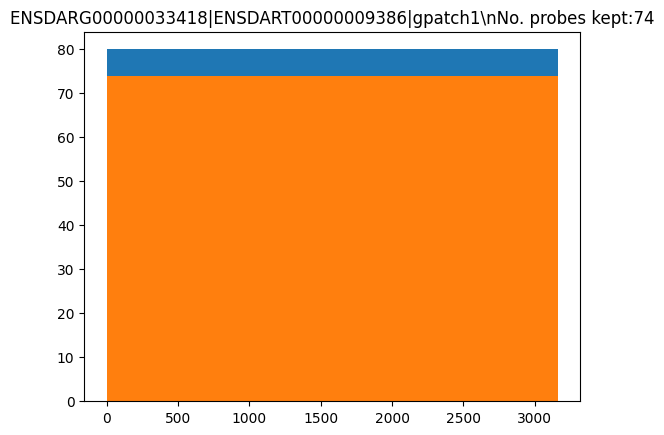

In [41]:
from tqdm.notebook import tqdm
for in_fileT in tqdm(in_files[:]):

    in_file  = str(in_fileT)
    #print(in_file)
    #modify input file
    pb_designer.sequence_dic['file'] = in_file
    #modify save file
    pb_designer.save_file = in_file.replace('.fasta','.pbr')
    pb_designer.params_dic = {'word_size':17,'pb_len':40,'buffer_len':0,'max_count':2**16-1,'check_on_go':False,'auto':False}

    iso_file_top = in_file.replace('.fasta','_AutoIsoTop_v2.fasta')
    iso_file = in_file.replace('.fasta','_AutoIso_v2.fasta') 
    iso_file_top2 = in_file.replace('.fasta','_AutoIsoTop2_v2.fasta')
    for fl_ in [iso_file_top,iso_file,iso_file_top2]:
        if not os.path.exists(fl_):
            fid = open(fl_,'w')
            fid.close()

    #gene = os.path.basename(in_file).split('_')[0]

    pb_designer.dic_check={('transcriptome','local_transcript'):15,
            ('top_transcriptome','local_transcript_top'):5,
            ('top_transcriptome2','local_transcript_top2'):3,
            'repetitive':3,'gc':[0.25,0.75],'tm':70}

    if True:#not os.path.exists(pb_designer.save_file):
        pb_designer.load_sequence_file_and_paramaters()
        #modify maps
        key='local_transcript'
        pb_designer.map_dic[key]['file'] = iso_file
        pb_designer.files_to_OTmap("map_"+key,pb_designer.map_dic[key])
        
        key='local_transcript_top'
        names_iso,seqs_iso = lt.fastaread(iso_file_top)

        pb_designer.map_dic[key]['file'] = iso_file_top
        pb_designer.files_to_OTmap("map_"+key,pb_designer.map_dic[key])

            
            
        key='local_transcript_top2'
        names_iso,seqs_iso = lt.fastaread(iso_file_top2)

        pb_designer.map_dic[key]['file'] = iso_file_top2
        pb_designer.files_to_OTmap("map_"+key,pb_designer.map_dic[key])
            


        #compute
        pb_designer.compute_pb_report()
        pb_designer.perform_check_end()
        pb_designer.plots()
        pb_designer.save_csv(name=os.path.basename(in_file).split('.')[0])
       

In [42]:
def get_pb_est(pbr_fl):
    pb_designer.load_pbr(pbr_fl)
    pb_reports = pb_designer.pb_reports
    pb_reports_keep = pb_designer.pb_reports_keep


    dic_check = pb_designer.dic_check
    dic_fracs = {}
    for key_ch in dic_check:
        if type(key_ch) is tuple:
            k0,k1 = key_ch[0],key_ch[1]
            x0 = np.array([pb_reports[key][k0] for key in pb_reports.keys()])
            x1 = np.array([pb_reports[key][k1] for key in pb_reports.keys()])
            x=x0-x1
            y0 = np.array([pb_reports_keep[key][k0] for key in pb_reports_keep.keys()])
            y1 = np.array([pb_reports_keep[key][k1] for key in pb_reports_keep.keys()])
            y=y0-y1
            kp_nm = key_ch[0]
        else:
            x = np.array([pb_reports[key][key_ch] for key in pb_reports.keys()])
            y = np.array([pb_reports_keep[key][key_ch] for key in pb_reports_keep.keys()])
            kp_nm = key_ch
        check_val = dic_check[key_ch]
        if type(check_val) is list:
            keep = (x>np.min(check_val))&(x<np.max(check_val))
        else:
            if key_ch=='tm':
                keep = x>=check_val
            else:
                keep = x<=check_val
        dic_fracs[kp_nm] = np.sum(keep)/float(len(keep))

    pb_len = pb_designer.params_dic['pb_len']
    buffer_len = pb_designer.params_dic['buffer_len']
    len_sq = np.max([pb_reports[kpb]['pb_index'] for kpb in pb_reports])+pb_len+1
    n_max = int(len_sq/(pb_len+buffer_len))
    dic_fracs['actual'] = len(pb_reports_keep)/float(n_max)
    return dic_fracs

In [43]:
import os,glob
from tqdm.notebook import tqdm
pb_folders = [r'Lib1000\single_genes_ENSDARG']
pbr_files = [fl for pb_folder in pb_folders for fl in glob.glob(pb_folder+os.sep+'*.pbr')]
pbr_files
dics = [get_pb_est(pbr_fl) for pbr_fl in tqdm(pbr_files)]


  0%|          | 0/998 [00:00<?, ?it/s]

lypd6b 35
bida 29
scinlb 61
mcm6 71
rgs12a 116
lamb1a 131
lgals3b 31
fscn1a 72
perp 62
zmp_0000000624 17
uhrf1 118
atf6 83
ctcf 129
zfand6 35
htr1d 60
BX005043.1 9
hoxb7a 19
c1qbp 27
rrm2 51
PCDH8 72
oclna 69
tcf7 37
gata6 57
cxcr4b 36
macroh2a2 47
slit1a 143
tpx2 95
tbx6 72
spty2d1 126
rpsa 87
rab14 54
col11a1a 164
plekhn1 59
rnd1b 69
gbx1 42
aldob 82
foxc1a 51
fnbp1l 52
chrd 91
CU639469.1 149
igf1ra 149
lhx5 50
ppargc1a 61
egln1b 55
ptp4a2b 97
CABZ01056843.1 56
fbln2 131
otx2b 50
rnd3a 94
si_dkey-117m1.4 70
ippk 55
si_dkey-66i24.9 42
mgat3a 50
si_ch211-27e6.1 50
camsap3 118
rac1a 44
rpl5a 23
ctnna1 87
lhx1a 56
rbm7 31
map7d1a 141
pnocb 30
usf1 56
si_dkey-261h17.1 35
rfx2 94
ptprfb 189
pdap1b 30
mycb 38
emx2 41
zgc_113372 26
mych 56
zgc_194246 15
cux1a 132
epha4a 109
sema5bb 90
setx 175
zgc_153039 74
clstn1 148
gata2a 64
pcdh10b 112
fgfrl1a 73
adipor1a 59
ypel3 38
smarcd3b 99
spon1b 87
cdc42ep4b 98
FAM83G 129
irak3 49
foxc1b 44
nrarpa 78
kmt2cb 410
znfl2a 25
si_dkey-92i17.2 36
rp2 53


plxnb1a 140
myod1 36
fzd8a 60
mcm4 71
foxa 40
rgmb 93
mcm2 116
cntfr 49
ELAPOR1 83
dusp6 68
itga5 124
fbn2b 213
mespaa 44
tubb2b 32
angptl4 55
dkc1 41
hp1bp3 77
ndst1b 139
admp 50
higd1a 44
cst3 19
smad6b 52
rap2b 54
mmp15b 66
ncapd2 120
vps13c 329
foxd5 26
unga 28
scube3 81
aif1l 51
rdh10b 42
si_dkey-22o22.2 210
notch2 233
foxp1b 68
pitx2 67
cacnb4b 78
cd63 30
six4b 57
etv5a 88
itga6a 96
cxcl12b 60
l1cama 100
efna1b 41
h1m 39
rpl34 16
tiparp 64
srrm4 233
sntg2 82
fras1 314
hdlbpa 120
srpra 72
dmd 276
adka 63
zic2b 50
mef2d 122
dlx3b 35
gmnn 23
si_dkey-108k21.14 11
si_ch73-335l21.4 28
ca9 29
gsc 29
cd9a 34
btg2 54
si_dkey-261m9.12 10
taf6 106
foxh1 105
clocka 143
zgc_113424 27
skilb 53
ackr3b 46
pmp22a 24
her6 33
vent 70
drll.2 38
ca15b 37
si_dkey-253i9.4 163
sulf1 129
sox17 57
dzip1 76
gid8b 79
fam83d 53
tph1b 53
pax6b 124
nsd2 126
ccng1 42
agrn 199
frmd4ba 131
sp5l 47
klf8 52
kif15 104
si_ch73-1a9.3 30
rasl11b 39
lama1 233
rgs12b 142
rreb1b 168
insrb 134
akap12b 196
brd3a 64
sptan1 1

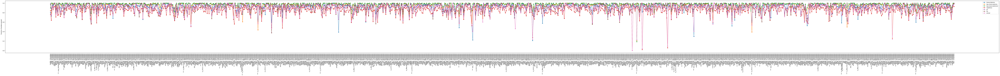

In [45]:
nprobes = []
for pbr_fl in pbr_files:
    name= os.path.basename(pbr_fl).split('_ENSDARG')[0]
    csv_fl = pbr_fl.replace('.pbr','.csv')
    if os.path.exists(csv_fl):
        npb = len([ln for ln in open(csv_fl,'r')][1:])
    else:
        npb=0
    print(name,npb)    
    nprobes.append(npb)

import matplotlib.pylab as plt
keys = dics[0].keys()
data_fracs = np.array([[dic[key] for dic in dics] for key in keys])
plt.figure(figsize=(150,8))
for data_,key in zip(data_fracs,keys):
    plt.plot(data_,'o-',label=key)
genes = [('***  ' if npb<20 else '') + os.path.basename(fl).split('_ENSDARG')[0]+' - '+str(npb)+' probes' 
         for fl,npb in zip(pbr_files,nprobes)]
plt.xticks(np.arange(len(genes)),genes,rotation='vertical')
plt.ylabel("Fraction of probes passed")
plt.legend()
plt.show()

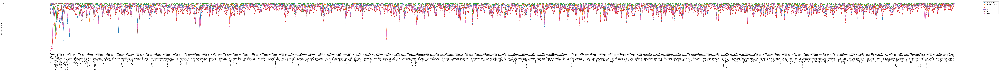

In [46]:
import matplotlib.pylab as plt
ipbs = np.argsort(nprobes)[:]
keys = dics[0].keys()
data_fracs = np.array([[dic[key] for dic in dics] for key in keys])
data_fracs = data_fracs[:,ipbs]
plt.figure(figsize=(150,8))
for data_,key in zip(data_fracs,keys):
    plt.plot(data_,'o-',label=key)
genes = [('***  ' if npb<20 else '') + os.path.basename(fl).split('_ENSDARG')[0]+' - '+str(npb) 
         for fl,npb in zip(np.array(pbr_files)[ipbs],np.array(nprobes)[ipbs])]
plt.xticks(np.arange(len(np.array(genes))),np.array(genes),rotation='vertical')
plt.ylabel("Fraction of probes passed")
plt.legend()
plt.show()

In [47]:
for i,pbr_fl in enumerate(pbr_files):
    if nprobes[i]==0:
        print(os.path.basename(pbr_fl).split('_ENSDARG')[0])

BX530721.1


In [48]:
few_probes = [os.path.basename(fl).split('.')[0] for fl in np.array(pbr_files)[ipbs][np.array(nprobes)[ipbs]<30]]

In [49]:
os.path.basename(in_files[0]).split('.')[0]

'pou5f3_ENSDARG00000044774'

Most genes have 20 probes

In [50]:
out_files = glob.glob(r'Lib1000\single_genes_ENSDARG\*.csv')

import numpy as np
def read_target_seqs(fl):
    txts = np.array([ln.replace('\n','').split(',') for ln in open(fl,'r') if len(ln)>2][1:])
    seqs = np.array([txt.replace("'",'')[1:] for txt in txts[:,0]])
    names = txts[:,1]
    return names,seqs
dic_npbs ={}
for out_fl in out_files:
    names,seqs = read_target_seqs(out_fl)
    nm_gn = os.path.basename(names[0]).split('_pb')[0]
    #print(nm_gn,len(seqs))
    dic_npbs[nm_gn]=len(seqs)

gns = list(dic_npbs.keys())
igns = np.argsort([dic_npbs[gn] for gn in gns])

In [51]:
import numpy as np
def read_target_seqs(fl):
    txts = np.array([ln.replace('\n','').split(',') for ln in open(fl,'r') if len(ln)>2][1:])
    seqs = np.array([txt.replace("'",'')[1:] for txt in txts[:,0]])
    names = txts[:,1]
    return names,seqs
out_fl = out_files[0]
names,seqs = read_target_seqs(out_fl)
nm_gn = os.path.basename(names[0]).split('_pb')[0]

In [52]:
names

array(['si_ch211-163l21_pb_0', 'si_ch211-163l21_pb_94',
       'si_ch211-163l21_pb_134', 'si_ch211-163l21_pb_174',
       'si_ch211-163l21_pb_214', 'si_ch211-163l21_pb_254',
       'si_ch211-163l21_pb_294', 'si_ch211-163l21_pb_334',
       'si_ch211-163l21_pb_374', 'si_ch211-163l21_pb_418',
       'si_ch211-163l21_pb_458', 'si_ch211-163l21_pb_498',
       'si_ch211-163l21_pb_558', 'si_ch211-163l21_pb_598',
       'si_ch211-163l21_pb_644', 'si_ch211-163l21_pb_684',
       'si_ch211-163l21_pb_724', 'si_ch211-163l21_pb_764',
       'si_ch211-163l21_pb_804', 'si_ch211-163l21_pb_844',
       'si_ch211-163l21_pb_884', 'si_ch211-163l21_pb_924',
       'si_ch211-163l21_pb_964', 'si_ch211-163l21_pb_1004',
       'si_ch211-163l21_pb_1044', 'si_ch211-163l21_pb_1084',
       'si_ch211-163l21_pb_1124', 'si_ch211-163l21_pb_1179',
       'si_ch211-163l21_pb_1219', 'si_ch211-163l21_pb_1259',
       'si_ch211-163l21_pb_1316', 'si_ch211-163l21_pb_1358',
       'si_ch211-163l21_pb_1398', 'si_ch211-163l21

### Check that the readouts/primers used are orthogonal to the genome/transcriptome

#### Construct 12bp count tables - only need to do it once

In [53]:
genome_fl = r'Data\z11\GCF_000002035.6_GRCz11_genomic.fna'
ct = ld.countTable(word=12,save_file=genome_fl.replace('.fna','_12w.bin'),
                   sparse=False)
fl = genome_fl
names,seqs = lt.fastaread(fl)
from tqdm import tqdm
for sq in tqdm(seqs):
    ct.consume(sq.upper(),verbose=False)
ct.complete(verbose=True)
ct.save()

  1%|▌                                                                             | 15/1923 [03:33<7:31:47, 14.21s/it]


KeyboardInterrupt: 

In [54]:
genome_fl = r'Data\z11\zebrafish_GRCz11_genesUnspliced_top3000_50p-epiboly.fasta'
ct = ld.countTable(word=12,save_file=genome_fl.replace('.fasta','_12w.bin'),
                   sparse=False)
fl = genome_fl
names,seqs = lt.fastaread(fl)
from tqdm import tqdm
for sq in tqdm(seqs[:]):
    ct.consume(sq.upper(),verbose=False)
ct.complete(verbose=True)
ct.save()

100%|█████████████████████████████████████████████████████████████████████████████| 2933/2933 [00:13<00:00, 222.74it/s]


Time to compute unique and clip: 6.771254301071167
Time to update matrix: 0.046916961669921875


### Screen PCR primers and Readout primers against genome and top transcriptome

In [57]:
pcr_primers = np.array([ln.replace('\n','').split(',') for ln in open(r'Data\Readouts\PCR_primers - pcr.csv','r') if len(ln)>2][1:])

In [58]:
import numpy as np
txts = [ln.replace('\n','').split(',') for ln in open(r'Data\Readouts\NDB_brightness2.csv','r') if len(ln)>2]
head = txts[0]
txts = np.array(txts)[1:]
ndbs_info = np.array([r for r1,r2,r3 in zip(txts[txts[:,1]=='750'],txts[txts[:,1]=='647'],txts[txts[:,1]=='561']) for r in [r1,r2,r3]])

In [59]:
import numpy as np
cnames,cseqs = lt.fastaread(r'Data\Readouts\final_candidate_readouts_v2.fasta')
cnames = [nm.replace('bc25mer','bcm')for nm in cnames]
def read_target_seqs(fl):
    txts = np.array([ln.replace('\n','').split(',') for ln in open(fl,'r') if len(ln)>2][1:])
    seqs = np.array([txt.replace("'",'')[1:] for txt in txts[:,0]])
    names = txts[:,1]
    return names,seqs

Text(0.5, 0, 'PCR primers')

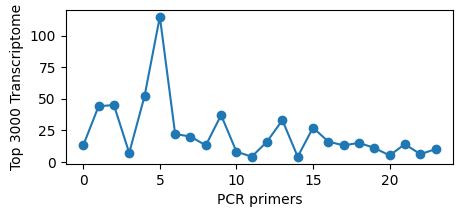

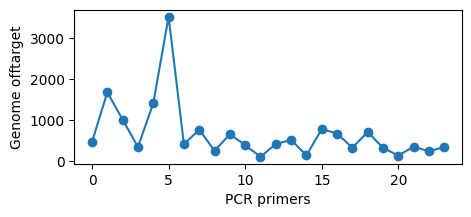

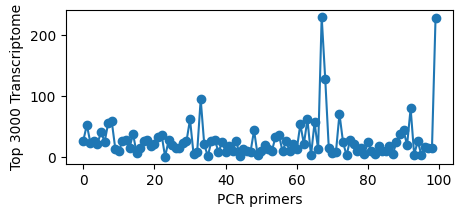

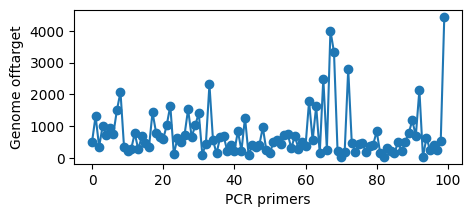

In [60]:
Rs = ndbs_info[:,-1][:100]
pcrs = [pr[-20:] for _,pr in pcr_primers]
offts = np.array([[ct.get(R)+ct.get(lt.seqrc(R)) for R in pcrs] for ct in [ct_tr,ct_gn]]).T

#print(np.any(offts>np.median(offts)*5))

plt.figure(figsize=(5,2))
plt.plot(offts[:,0],'o-')
plt.ylabel('Top 3000 Transcriptome')
plt.xlabel('PCR primers')
plt.figure(figsize=(5,2))
plt.plot(offts[:,1],'o-')
plt.ylabel('Genome offtarget')
plt.xlabel('PCR primers')


offts = np.array([[ct.get(R)+ct.get(lt.seqrc(R)) for R in Rs] for ct in [ct_tr,ct_gn]]).T

#print(np.any(offts>np.median(offts)*5))

plt.figure(figsize=(5,2))
plt.plot(offts[:,0],'o-')
plt.ylabel('Top 3000 Transcriptome')
plt.xlabel('PCR primers')
plt.figure(figsize=(5,2))
plt.plot(offts[:,1],'o-')
plt.ylabel('Genome offtarget')
plt.xlabel('PCR primers')

Text(0.5, 0, 'PCR primers')

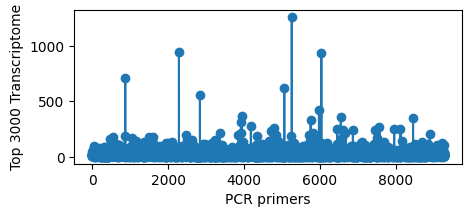

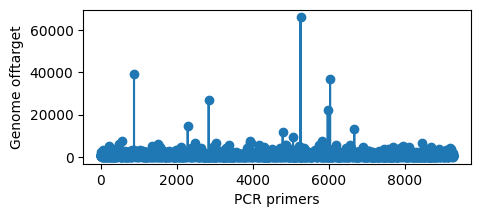

In [61]:
offts = np.array([[ct.get(R)+ct.get(lt.seqrc(R)) for R in cseqs] for ct in [ct_tr,ct_gn]]).T

#print(np.any(offts>np.median(offts)*5))

plt.figure(figsize=(5,2))
plt.plot(offts[:,0],'o-')
plt.ylabel('Top 3000 Transcriptome')
plt.xlabel('PCR primers')
plt.figure(figsize=(5,2))
plt.plot(offts[:,1],'o-')
plt.ylabel('Genome offtarget')
plt.xlabel('PCR primers')

In [62]:
keep_reads2 = np.all(offts<np.percentile(offts,90,axis=0),axis=-1)
cseqs_kp = np.array(cseqs)[keep_reads2]
cnames_kp = np.array(cnames)[keep_reads2]
lt.fastawrite(r'Data\Readouts\final_candidate_readouts_zebrafish.fasta',
             cnames_kp,cseqs_kp)

Text(0.5, 0, 'PCR primers')

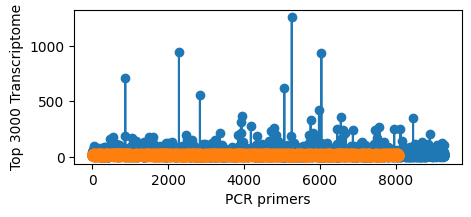

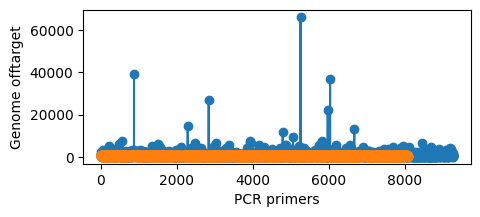

In [63]:
plt.figure(figsize=(5,2))
plt.plot(offts[:,0],'o-')
plt.plot(offts[keep_reads2,0],'o-')
plt.ylabel('Top 3000 Transcriptome')
plt.xlabel('PCR primers')
plt.figure(figsize=(5,2))
plt.plot(offts[:,1],'o-')
plt.plot(offts[keep_reads2,1],'o-')
plt.ylabel('Genome offtarget')
plt.xlabel('PCR primers')

### Sequential library

In [56]:
import sys,os,glob
sys.path.append(os.path.abspath(r'LibraryDesign3'))
import LibraryDesigner as ld
import LibraryTools as lt
from seqint import seq2Int, seq2Int_rc
# some other packages may required
import Bio #use pip install biopython
import numpy as np
def read_target_seqs(fl):
    txts = np.array([ln.replace('\n','').split(',') for ln in open(fl,'r') if len(ln)>2][1:])
    seqs = np.array([txt.replace("'",'')[1:] for txt in txts[:,0]])
    names = txts[:,1]
    return names,seqs



out_files = glob.glob(r'Lib1000\single_genes_ENSDARG\*.csv')
dic_npbs ={}
for out_fl in out_files:
    names,seqs = read_target_seqs(out_fl)
    nm_gn = os.path.basename(names[0]).split('_pb')[0]
    #print(nm_gn,len(seqs))
    dic_npbs[nm_gn]=len(seqs)

gns = list(dic_npbs.keys())
igns = np.argsort([dic_npbs[gn] for gn in gns])
print(list(zip(np.array(gns)[igns],np.array([dic_npbs[gn] for gn in gns])[igns])))

[('thy1_ENSDARG00000035018', 2), ('znfl1i_ENSDARG00000079126', 2), ('nr6a1a_ENSDARG00000096224', 5), ('znf1004_ENSDARG00000110008', 8), ('si_ch211-114n24', 8), ('si_ch211-113a14', 8), ('BX005043', 9), ('rplp2l_ENSDARG00000011201', 10), ('si_dkey-261m9', 10), ('si_dkey-108k21', 11), ('si_ch73-274k23', 12), ('ube2c_ENSDARG00000101618', 12), ('snrpd1_ENSDARG00000011648', 12), ('si_dkey-27i16', 12), ('rps15_ENSDARG00000070849', 12), ('snrpg_ENSDARG00000099667', 12), ('zgc_174153_ENSDARG00000079376', 12), ('mgp_ENSDARG00000086189', 13), ('snrpf_ENSDARG00000105037', 13), ('zgc_174154_ENSDARG00000075527', 13), ('snrpd3l_ENSDARG00000076283', 14), ('BX005396', 14), ('rps27', 14), ('rpl26_ENSDARG00000102317', 14), ('snrpd3_ENSDARG00000013800', 14), ('rps23_ENSDARG00000021838', 14), ('dynll2b_ENSDARG00000005172', 15), ('zgc_153405_ENSDARG00000096992', 15), ('zgc_194246_ENSDARG00000092889', 15), ('rps21_ENSDARG00000025850', 15), ('rpl38_ENSDARG00000006413', 16), ('rpl34_ENSDARG00000029500', 16), (

In [65]:
cnames,cseqs = lt.fastaread(r'Data\Readouts\final_candidate_readouts_zebrafish.fasta')

In [66]:
pcr_primers = np.array([ln.replace('\n','').split(',') for ln in open(r'Data\Readouts\PCR_primers - pcr.csv','r') if len(ln)>2][1:])
pcr_primers

array([['W1A01_primer_0', 'CGGCTCGCAGCGTGTAAACG'],
       ['W1A02_primer_1', 'TAATACGACTCACTATAGGGCATTTCAGGATCACCGGCGG'],
       ['W1A03_primer_2', 'CCCGCAATGGCTGACAACCG'],
       ['W1A04_primer_3', 'TAATACGACTCACTATAGGGCGTTGTATGCCCTCCACGC'],
       ['W1A05_primer_4', 'CATTCAGCATTGCGCAACGG'],
       ['W1A06_primer_5', 'TAATACGACTCACTATAGGGTCTTCCCGCAAATGCACCG'],
       ['W1A07_primer_6', 'CGCAAACTGGTGCGGAAGGC'],
       ['W1A08_primer_7', 'TAATACGACTCACTATAGGGCCCTTTCGCGCTGCATCGAC'],
       ['W1A09_primer_8', 'TTGTTGAGGCGGCGGAAGTC'],
       ['W1A10_primer_9', 'TAATACGACTCACTATAGGGATTGCCGCATGGTTTCCG'],
       ['W1A11_primer_10', 'TTGCTAGCGTGGGCCAATCG'],
       ['W1A12_primer_11', 'TAATACGACTCACTATAGGGCCATTGCCCGCGAGGTCGAG'],
       ['W1B01_primer_12', 'TTGGGCGTGCACGTCAATTC'],
       ['W1B02_primer_13', 'TAATACGACTCACTATAGGGCAATTAATCGCCCGGTGCCA'],
       ['W1B03_primer_14', 'GACATCCAGGCGCGGACAAC'],
       ['W1B04_primer_15', 'TAATACGACTCACTATAGGGCTTGTGCATCGCGCCAAAGA'],
       ['W1B05_primer_

In [67]:
nmA_,A = ['W1B03_primer_14', 'GACATCCAGGCGCGGACAAC']
nmB_,B = ['W1B08_primer_19', 'TAATACGACTCACTATAGGGCATGTGTCACCGCTCCGTGG']

nmA_ = nmA_.split('_')[0]
nmB_ = nmB_.split('_')[0]
B = lt.seqrc(B[-20:])

nmax = 60
iNDB = 500 #make sure the linkers are orthogonal to Jakob's library
lib_names,lib_seqs=[],[]

files_ = glob.glob(r'Lib1000\single_genes_ENSDARG\*.csv')
print("Found number of genes:",len(files_))
for fl in files_:
    names,seqs = read_target_seqs(fl)
    if ("pou5f3" in names[0]) or ("actb2" in names[0]): #house keeping genes get even and odd probes
        print(names[0])
        names = names[:nmax]
        seqs = seqs[:nmax]       
        ndb_sqs = [cseqs[iNDB],cseqs[iNDB+1]]
        ndb_nms = [cnames[iNDB],cnames[iNDB+1]]
        
        tag = nmA_+'--'+nmB_+'__'
        seqs = [lt.up_down([A,ndb_sqs[isq%2],lt.seqrc(sq),ndb_sqs[isq%2],ndb_sqs[isq%2],B]) for isq,sq in enumerate(seqs)]
        names = [tag+ndb_nms[isq%2]+'__'+nm for isq,nm in enumerate(names)]
        iNDB+=2
        lib_names.extend(names)
        lib_seqs.extend(seqs)
    elif len(seqs)>=5:
        names = names[:nmax]
        seqs = seqs[:nmax]
        
        #changed to have one probe set for each gene
        #ndb_sqs = [cseqs[2*iNDB],cseqs[2*iNDB+1]]
        #ndb_nms = [cnames[2*iNDB],cnames[2*iNDB+1]]
        
        ndb_sqs = cseqs[iNDB]
        ndb_nms = cnames[iNDB]

        tag = nmA_+'--'+nmB_+'__'
        #seqs = [lt.up_down([A,ndb_sqs[isq%2],lt.seqrc(sq),ndb_sqs[isq%2],ndb_sqs[isq%2],B]) for isq,sq in enumerate(seqs)]
        #names = [tag+ndb_nms[isq%2]+'__'+nm for isq,nm in enumerate(names)]
        seqs = [lt.up_down([A,ndb_sqs,lt.seqrc(sq),ndb_sqs,ndb_sqs,B]) for sq in seqs]
        names = [tag+ndb_nms+'__'+nm for nm in names]
        iNDB+=1
        lib_names.extend(names)
        lib_seqs.extend(seqs)

Found number of genes: 997
pou5f3_ENSDARG00000044774_pb_4
actb2_ENSDARG00000037870_pb_0


In [68]:
lt.fastawrite(r'Lib1000\ASYW_M2.fasta',lib_names,lib_seqs)

In [69]:
iNDB

1497

In [70]:
lib_names,lib_seqs = lt.fastaread(r'Lib1000\ASYW_M2.fasta')

In [71]:
### Check number of probes

print(len(lib_names),len(lib_seqs))

48658 48658


In [72]:

### Check primer counts
np.unique([sq[:20]+sq[-20:]+nm.split('_')[0] for nm,sq in zip(lib_names,lib_seqs)],return_counts=True)


(array(['GACATCCAGGCGCGGACAACccacggagcggtgacacatgW1B03--W1B08'],
       dtype='<U52'),
 array([48658], dtype=int64))

In [ ]:
### Blast a probe on ncbi

In [ ]:
>W1B03--W1B08__bcm_6730__shroom3_ENSDARG00000102180_pb_1746
GACATCCAGGCGCGGACAACagtcttctcgccaggttgtaCGTAAACTGAATCAACAGAATACCTTTGCCTCTCTCCTCTagtcttctcgccaggttgtaAGTCTTCTCGCCAGGTTGTAccacggagcggtgacacatg



Danio rerio shroom family member 3 (shroom3), mRNA
Sequence ID: NM_001278851.1Length: 5887Number of Matches: 1
Related Information
Gene-associated gene details
Genome Data Viewer-aligned genomic context
Range 1: 1639 to 1678GenBankGraphicsNext MatchPrevious Match
Alignment statistics for match #1
Score	Expect	Identities	Gaps	Strand
75.0 bits(40)	9e-14	40/40(100%)	0/40(0%)	Plus/Minus
Query  1     CGTAAACTGAATCAACAGAATACCTTTGCCTCTCTCCTCT  40
             ||||||||||||||||||||||||||||||||||||||||
Sbjct  1678  CGTAAACTGAATCAACAGAATACCTTTGCCTCTCTCCTCT  1639

### Screen probe library for genome and top transcriptome off-targets

In [73]:
genome_fl = r'Data\z11\GCF_000002035.6_GRCz11_genomic_12w.bin'
#genome_fl = r'C:\Users\Bogdan\Dropbox\SchierLab\z11\zebrafish_GRCz11_genesUnspliced_top3000_50p-epiboly.fasta'
ct_gn = ld.countTable(word=12,save_file=genome_fl.replace('.fasta','_12w.bin').replace('.fna','_12w.bin'),
                   sparse=False)
ct_gn.load()

tr_fl = r'Data\z11\zebrafish_GRCz11_genesUnspliced_top3000_50p-epiboly_12w.bin'
ct_tr = ld.countTable(word=12,save_file=tr_fl.replace('.fasta','_12w.bin').replace('.fna','_12w.bin'),
                   sparse=False)
ct_tr.load()

In [74]:
offts = np.array([[ct.get(R)+ct.get(lt.seqrc(R)) for R in lib_seqs] for ct in [ct_tr,ct_gn]]).T

Text(0.5, 0, 'readouts')

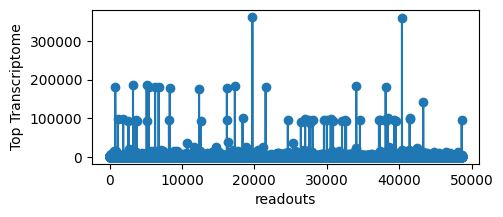

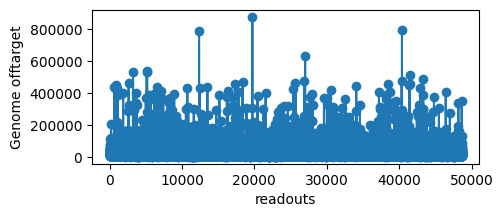

In [75]:
import matplotlib.pylab as plt
plt.figure(figsize=(5,2))
plt.plot(offts[:,0],'o-')
plt.ylabel('Top Transcriptome')
plt.xlabel('readouts')
plt.figure(figsize=(5,2))
plt.plot(offts[:,1],'o-')
plt.ylabel('Genome offtarget')
plt.xlabel('readouts')


In [76]:
keep = (offts[:,0]<3000)&(offts[:,1]<200000)
print(np.sum(keep))

47870


Text(0.5, 0, 'readouts')

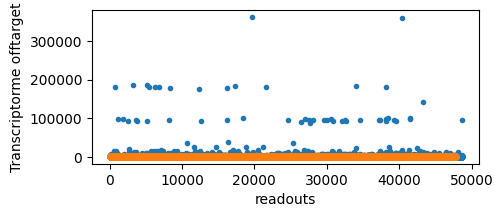

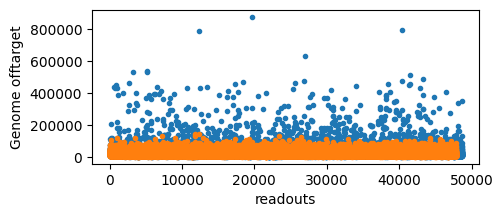

In [77]:
plt.figure(figsize=(5,2))
plt.plot(offts[:,0],'.')
plt.plot(offts[keep,0],'.')
plt.ylabel('Transcriptorme offtarget')
plt.xlabel('readouts')

plt.figure(figsize=(5,2))
plt.plot(offts[:,1],'.')
plt.plot(offts[keep,1],'.')
plt.ylabel('Genome offtarget')
plt.xlabel('readouts')

In [78]:
lib_names,lib_seqs = lt.fastaread(r'Lib1000\ASYW_M2.fasta')
gns,cts  =np.unique([nm.split('__')[-1].split('_pb')[0]for nm in np.array(lib_names)[keep]],return_counts=True)
dic_counts_keep = {gn:ct for gn,ct in zip(gns,cts)}
gns,cts  =np.unique([nm.split('__')[-1].split('_pb')[0]for nm in np.array(lib_names)[~keep]],return_counts=True)
dic_counts_nokeep = {gn:ct for gn,ct in zip(gns,cts)}

print(np.max([dic_counts_nokeep[gn]/(dic_counts_nokeep[gn]+dic_counts_keep[gn]) for gn in dic_counts_nokeep]))
### The fraction of probes discarded for the most affected gene upon filtering the probes.

0.16666666666666666


In [79]:
lt.fastawrite(r'Lib1000\ASYW_M2_v2.fasta',np.array(lib_names)[keep],np.array(lib_seqs)[keep])

In [80]:
lib_names,lib_seqs = lt.fastaread(r'Lib1000\ASYW_M2_v2.fasta')

In [81]:
used_primers = list(np.unique([sq_ for sq in lib_seqs for sq_ in [sq[:20],sq[-20:]]]))
from tqdm.notebook import tqdm
dists = [[lt.simmilar(prm.upper(),sq.upper(),val=13)for prm in used_primers] for sq in tqdm(lib_seqs)]
dists = np.array(dists)

#np.unique(dists,return_counts=True)
np.unique(dists,return_counts=True)

sdist = np.sum(dists,axis=-1)
keep = sdist==np.min(sdist)

  0%|          | 0/47870 [00:00<?, ?it/s]

In [82]:
print("Screened out internal PCR priming probes:",np.sum(~keep))

lt.fastawrite(r'Lib1000\ASYW_M2_v3.fasta',np.array(lib_names)[keep],np.array(lib_seqs)[keep])

Screened out internal PCR priming probes: 2


In [83]:
lib_names,lib_seqs = lt.fastaread(r'Lib1000\ASYW_M2_v3.fasta')

In [86]:
nm_prevs = []
gn_prevs = []
adts_names,adts_seqs = [],[]
ign = -1
tails = ['TTTGCACTGCCGTCCTTGACTTTGCACTGCCGTCCTTGAC','GATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC','TGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA']
nm_tails = ['-2xStv_82rc','-2xStv_1rc','-2xStv_79rc']
nm_tails = ['Stv1','Stv79']
tails = ['GATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC','TGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA']
for nm,sq in zip(lib_names,lib_seqs):
    pcr,bcm,gn = nm.split('__')
    gn = gn.split('_pb')[0]
    nm_ = bcm+'__'+gn
    
        
    if gn not in gn_prevs:
        ign+=1
    if nm_ not in nm_prevs:
        nm_prevs.append(nm_)
        sq__,nm__ = tails[ign%len(tails)],nm_tails[ign%len(tails)]
        print(nm_+'--'+nm__+', '+lt.seqrc(sq[20:40])+sq__)
        adts_names.append(nm_+'--'+nm__)
        adts_seqs.append(lt.seqrc(sq[20:40])+sq__)
        gn_prevs.append(gn)

bcm_3412__si_ch211-163l21--Stv1, ttaacgacgtaaccagctcaGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_3419__fadd_ENSDARG00000103021--Stv79, aacgtgggcgctattggaatTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_3420__kita_ENSDARG00000043317--Stv1, gccgcagtctaacgtcaaatGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_3422__mcm4_ENSDARG00000040041--Stv79, ggtcagtataccccgaagacTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_3428__rbm7_ENSDARG00000020841--Stv1, agtagcaaccgcgtcagtaaGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_3434__mylipa_ENSDARG00000008859--Stv79, tcaccacgacaatagctgtcTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_3436__tmed9_ENSDARG00000004261--Stv1, gcgtggacgcagtatccatcGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_3446__fn1b_ENSDARG00000006526--Stv79, acagagcatcgtcacccgacTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_3450__dock5_ENSDARG00000001968--Stv1, gaggtgactgcggacacatcGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_3454__vcana_ENSDARG00000103515--Stv79, aggatcagtacgacccaggaTGCGAACTGTCCGGCTTTC

bcm_7123__slc44a2_ENSDARG00000037059--Stv1, gatactgtgagccgcaaactGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_7129__mcm3_ENSDARG00000024204--Stv79, gtgcggggcactatcgtaaaTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_7131__trib3_ENSDARG00000016200--Stv1, attagcggctagacttcatcGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_7133__dlx3b_ENSDARG00000014626--Stv79, gtggcactggtcgaacgaacTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_7134__stmn1a_ENSDARG00000004169--Stv1, ccacctcgtagttatcctgcGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_7136__egln1b_ENSDARG00000004632--Stv79, taacgaacgacagattgaccTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_7146__pawr_ENSDARG00000045486--Stv1, gtcctcaacgcatcagacagGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_7147__gmnn_ENSDARG00000035957--Stv79, gcacaaaccgggttacctcgTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_7148__h1m_ENSDARG00000102892--Stv1, caaagtctcggtagggcaatGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_7155__prdm1a_ENSDARG00000002445--Stv79, gtcgccggtatagacactccTGCGAA

bcm_8508__hapln1b_ENSDARG00000068516--Stv79, cgggcatcatcgacatcgtaTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_8512__pcdh7b_ENSDARG00000060610--Stv1, gtaatgaggatcgccccacaGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_8533__tbxtb_ENSDARG00000039806--Stv79, acctcgctccgagaatgtcgTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_8535__tbxta_ENSDARG00000101576--Stv1, cccaaatgtgtcgcagtacaGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_8546__slc4a4a_ENSDARG00000013730--Stv79, atgaccgctaagccacgttaTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_8551__rpl39_ENSDARG00000036316--Stv1, cttaggggtgtcgaccatatGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_8555__chd4b_ENSDARG00000025789--Stv79, taacccaactttcgtgcggtTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_8558__esco2_ENSDARG00000014685--Stv1, tagcgaggagcggatttgtgGATCCGATTGGAACCGTCCCGATCCGATTGGAACCGTCCC
bcm_8563__skilb_ENSDARG00000022904--Stv79, atagcgtagagtcggtgataTGCGAACTGTCCGGCTTTCATGCGAACTGTCCGGCTTTCA
bcm_8568__klf17_ENSDARG00000038792--Stv1, catctaggcgcgatcaacaaG

In [88]:
import os
import pandas

well_pos = [let+str(i+1) for let in 'ABCDEFGHIJKLMNOP' for i in range(24)]
seqsPlate,namesPlate = adts_seqs,adts_names
nplates = int(np.ceil(len(namesPlate)/384))
iplate = 0
tag = 'ASYW2'
for iplate in range(nplates):
    data = [[well_pos[ign%len(well_pos)],nm,sq]for ign,(sq,nm) in enumerate(zip(seqsPlate,namesPlate))][iplate*384:(iplate+1)*384]
    plate_n = pandas.DataFrame(data,columns=['Well Position','Name','Sequence'])    
    if not os.path.exists(r'Lib1000/IDT_384_plates'):os.makedirs(r'Lib1000/IDT_384_plates')
    plate_n.to_excel(r'Lib1000/IDT_384_plates'+os.sep+tag+'_P'+str(iplate+1)+'.xlsx',index=False,sheet_name=tag+'_P'+str(iplate+1))


C:\Users\wan0000\AppData\Local\Temp\ipykernel_15284\1726503340.py:13: UserWarning: Pandas requires version '3.0.5' or newer of 'xlsxwriter' (version '3.0.3' currently installed).
  plate_n.to_excel(r'Lib1000/IDT_384_plates'+os.sep+tag+'_P'+str(iplate+1)+'.xlsx',index=False,sheet_name=tag+'_P'+str(iplate+1))


### Top 500 genes on priority list, generate new adapter plate

In [91]:
import pandas as pd
import os
import glob
import numpy as np

In [93]:
fls_plates_v1 = np.sort(glob.glob(r'Lib1000\IDT_384_plates\ASYW2*.xlsx'))
fls_plates_v1

array(['Lib1000\\IDT_384_plates\\ASYW2_P1.xlsx',
       'Lib1000\\IDT_384_plates\\ASYW2_P2.xlsx',
       'Lib1000\\IDT_384_plates\\ASYW2_P3.xlsx'], dtype='<U36')

In [94]:
plates_v1 = pd.DataFrame(columns = ['Well Position', 'Name', 'Sequence'])
for i in range(len(fls_plates_v1)):
    plate = pd.read_excel(fls_plates_v1[i])
    plate['Well Position'] = 'P' + str(i+1) +'__' + plate['Well Position']
    plates_v1 = pd.concat([plates_v1, plate])
    
plates_v1.set_index(['Well Position'], inplace=True)
library = pd.read_excel(r'Data\library_design_1000genes_v5.xlsx')

In [95]:
lib500 = library[library['is.top_500']]
ngenes = lib500.shape[0]
lib500

,ID,pref.trans.ID,names.zv11,NAMES.zv10,is.TF,is.landmark,is.morph,is.morph.CRISPR,cell.type,is.top_1000,is.top_500,plate,well,tail,Nprobes
0,ENSDARG00000058179,ENSDART00000063665,ackr3b,ACKR3B,False,False,True,True,NaN,True,True,2,C8,Stv79,46
3,ENSDARG00000018968,ENSDART00000023094,acvr1ba,ACVR1BA,False,False,True,False,NaN,True,True,1,O22,Stv79,58
4,ENSDARG00000056250,ENSDART00000078703,add3b,ADD3B,False,False,True,False,NaN,True,True,3,H13,Stv79,56
5,ENSDARG00000039429,ENSDART00000159585,adka,ADKA,False,False,False,False,NaN,True,True,2,P5,Stv79,59
6,ENSDARG00000025372,ENSDART00000037557,admp,ADMP,False,True,False,False,NaN,True,True,2,K8,Stv1,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,ENSDARG00000110008,ENSDART00000153911,znf1004,ZNF1004,True,False,False,False,NaN,True,True,1,O3,Stv1,8
495,ENSDARG00000103917,ENSDART00000168027,znf185,ZNF185,False,False,False,True,NaN,True,True,2,E2,Stv79,58
496,ENSDARG00000078164,ENSDART00000105514,znf576.2,ZNF576.2,True,False,False,False,NaN,True,True,3,C11,Stv1,43
497,ENSDARG00000008333,ENSDART00000004071,znfl2a,ZNFL2A,True,False,False,False,NaN,True,True,3,E24,Stv79,25


In [96]:
wells_v1 = 'P' + lib500['plate'].astype(str) + '__' + lib500['well']

well_pos = [let+str(i+1) for let in 'BCDEFGHIJKLMNO' for i in range(1, 23)] #avoid the edge wells
plate_v2 = (np.floor(np.arange(ngenes)/len(well_pos))+1).astype(int)
well_v2 = [well_pos[i] for i in np.mod(np.arange(lib500.shape[0]), len(well_pos))]
lib500 = lib500.assign(plate=plate_v2)
lib500 = lib500.assign(well=well_v2)
lib500.set_index(np.arange(ngenes), inplace=True)

In [97]:
lib500.to_excel('Lib1000\library_design_500genes.xlsx', index=False)

C:\Users\wan0000\AppData\Local\Temp\ipykernel_15284\2601097712.py:1: UserWarning: Pandas requires version '3.0.5' or newer of 'xlsxwriter' (version '3.0.3' currently installed).
  lib500.to_excel('Lib1000\library_design_500genes.xlsx', index=False)


In [98]:
data = plates_v1.loc[wells_v1, ['Name', 'Sequence']]
data = data.set_index(lib500['well'])
data['Well Position'] = data.index
data = data[['Well Position', 'Name', 'Sequence']]
data.set_index(np.arange(ngenes), inplace=True)
data

,Well Position,Name,Sequence
0,B2,bcm_6183__ackr3b_ENSDARG00000058179--Stv79,gtggggtctcgcaacgaaaaTGCGAACTGTCCGGCTTTCATGCGAA...
1,B3,bcm_5815__acvr1ba_ENSDARG00000018968--Stv79,gcggattcgcagtttatcacTGCGAACTGTCCGGCTTTCATGCGAA...
2,B4,bcm_9068__add3b_ENSDARG00000056250--Stv79,gaaggcgagatcgtgattcgTGCGAACTGTCCGGCTTTCATGCGAA...
3,B5,bcm_7954__adka_ENSDARG00000039429--Stv79,tacgccgtacgaccattgcaTGCGAACTGTCCGGCTTTCATGCGAA...
4,B6,bcm_7258__admp_ENSDARG00000025372--Stv1,tgtgattagcgtacactgccGATCCGATTGGAACCGTCCCGATCCG...
...,...,...,...
490,J8,bcm_5700__znf1004_ENSDARG00000110008--Stv1,cggaaggcgatacgttatggGATCCGATTGGAACCGTCCCGATCCG...
491,J9,bcm_6399__znf185_ENSDARG00000103917--Stv79,tatagaggacgccatttgcaTGCGAACTGTCCGGCTTTCATGCGAA...
492,J10,bcm_8364__znf576--Stv1,cgttctacggagcaactacgGATCCGATTGGAACCGTCCCGATCCG...
493,J11,bcm_8673__znfl2a_ENSDARG00000008333--Stv79,tccaaggaaccggtacacgtTGCGAACTGTCCGGCTTTCATGCGAA...


In [100]:
out_dir = r'Lib1000\IDT_384_plates_500genes'
if not os.path.exists(out_dir):
    os.mkdir(out_dir)
for iplate in np.unique(lib500['plate']):
    data[lib500['plate']==iplate].to_excel(out_dir+os.sep+'YW500_P'+str(iplate) + '.xlsx', index=False)

C:\Users\wan0000\AppData\Local\Temp\ipykernel_15284\787673005.py:5: UserWarning: Pandas requires version '3.0.5' or newer of 'xlsxwriter' (version '3.0.3' currently installed).
  data[lib500['plate']==iplate].to_excel(out_dir+os.sep+'YW500_P'+str(iplate) + '.xlsx', index=False)


### Orders

In [ ]:
### previous library
W1A07,CGCAAACTGGTGCGGAAGGC,100nm,STD
W1A10,TAATACGACTCACTATAGGGATTGCCGCATGGTTTCCG,100nm,STD
RT-Acr_W1A07,/5Acryd/CGCAAACTGGTGCGGAAGGC,250nm,HPLC

In [ ]:
W1B01_MERC,TTGGGCGTGCACGTCAATTC,100nm,STD
W1B02_MERC,TAATACGACTCACTATAGGGCAATTAATCGCCCGGTGCCA,STD
Acr_W1B01_MERS,/5Acryd/TTGGGCGTGCACGTCAATTC,250nm,HPLC
W1B05_MERS,CGGGTTTCGTTGCGCACACC,100nm,STD
W1B06_MERS,TAATACGACTCACTATAGGGCCTGTGCGGAAATCGCGAGA,STD
Acr_W1B05_MERS,/5Acryd/CGGGTTTCGTTGCGCACACC,250nm,HPLC
W1B03_SEQ,GACATCCAGGCGCGGACAAC,100nm,STD
W1B04_SEQ,TAATACGACTCACTATAGGGCTTGTGCATCGCGCCAAAGA,STD
Acr_W1B03_SEQ,/5Acryd/GACATCCAGGCGCGGACAAC,250nm,HPLC